In [1]:
from mcbj import *
from tqdm.notebook import tqdm
import filter_traces
import plots
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib import cm, colormaps, cycler, rcParams, gridspec, ticker
import utils

date = "22_02_03"
sample_rate = 50_000
# home_folder = Path(f"D:/BJ_Data/{date}")
home_folder = Path(f"//DATACENTER/BreakJunction_group/BJ_Data/{date}")

In [2]:
rcParams['figure.constrained_layout.use'] = False
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = ['Times New Roman']
rcParams['mathtext.fontset'] = 'stix'
rcParams['mathtext.rm'] = 'serif'
rcParams['xtick.direction'] = 'in'
rcParams['ytick.direction'] = 'in'
rcParams['xtick.labelsize'] = 4
rcParams['ytick.labelsize'] = 4
rcParams['xtick.major.pad'] = 2
rcParams['xtick.minor.pad'] = 0.8
rcParams['ytick.major.pad'] = 1
rcParams['ytick.minor.pad'] = 0.8
rcParams['axes.labelsize'] = 4
rcParams['axes.titlepad'] = 3.0
rcParams['axes.labelpad'] = 1.0
rcParams['agg.path.chunksize'] = 10000

In [3]:
def scatter_plot_matrix(data: pd.DataFrame, col_names: Tuple[str, ...], set_log: Tuple[bool, ...], set_limits: Tuple[Union[Tuple[float, float], None], ...] = None,
                        hue: Optional[str] = None, cmap = colormaps['Reds'], cmap_reversed=False, bins_num: Union[Tuple[int, ...], int] = 100,
                        figsize: Optional[Tuple[float, float]] = None, dpi: int = 300, min_plot_size=utils.cm2inch(8, 8), **scatter_kwargs):
        
    if hue is None:
        num_categories = 1
    else:
        num_categories = data[hue].nunique()
        categories = data[hue].unique()
        if cmap_reversed:
            my_cmap = cmap(np.linspace(0.25, 1, num_categories))[::-1]
        else:
            my_cmap = cmap(np.linspace(0.25, 1, num_categories))
        
    num_cols = len(col_names)
    
    if isinstance(bins_num, int):
        bins_num = (bins_num, )*num_cols
    
    # print(my_cmap)
    
    if len(set_log) != num_cols:
        raise ValueError('Not enough `set_log` parameters! Must be same length as `col_names`')
    
    if figsize is None:
        figsize = (1.1 * min_plot_size[0], min_plot_size[1])
    
    fig = plt.figure(figsize=figsize, dpi=dpi)  # figsize: (width, height) in inches
    gs = gridspec.GridSpec(nrows=num_cols, ncols=num_cols, width_ratios=num_cols*(1,), height_ratios=num_cols*(1,),
                           figure=fig, left=0.2, right=0.95, top=0.95, bottom=0.15, wspace=0.4, hspace=0.4)
    
    axs = []
    if num_categories == 1:
        for i, row in enumerate(col_names):
            for j, col in enumerate(col_names):
                axs.append(fig.add_subplot(gs[i, j]))
                axs[i*num_cols + j].set_xlabel(col_names[j])
                if i != j:
                    axs[i*num_cols + j].set_ylabel(col_names[i])
                    axs[i*num_cols + j].scatter(data[col_names[j]], data[col_names[i]], **scatter_kwargs)
                    if set_log[i]:
                        axs[i*num_cols + j].set_yscale('log')
                else:
                    axs[i*num_cols + j].set_ylabel('Counts [a.u.]')
                    bins, hist_1d = utils.calc_hist_1d_single(data=data[col_names[j]], xrange=(min(data[col_names[j]]), max(data[col_names[j]])),
                                                              xbins_num=bins_num[i], log_scale=set_log[j], bin_mode='total')

                    axs[i*num_cols + j].plot(bins, hist_1d, lw=1)

                if set_log[j]:
                    axs[i*num_cols + j].set_xscale('log')
    else:
        
        for i, row in enumerate(col_names):
            for j, col in enumerate(col_names):
                axs.append(fig.add_subplot(gs[i, j]))
                for k, cat in enumerate(categories):
                    axs[i*num_cols + j].set_xlabel(col_names[j])
                    if i != j:
                        axs[i*num_cols + j].set_ylabel(col_names[i])
                        axs[i*num_cols + j].scatter(data[data[hue]==cat][col_names[j]], data[data[hue]==cat][col_names[i]], color=my_cmap[k], **scatter_kwargs)
                        if set_log[i]:
                            axs[i*num_cols + j].set_yscale('log')
                    else:
                        axs[i*num_cols + j].set_ylabel('Counts [a.u.]')
                        bins, hist_1d = utils.calc_hist_1d_single(data=data[data[hue]==cat][col_names[j]], xrange=(min(data[data[hue]==cat][col_names[j]]), max(data[data[hue]==cat][col_names[j]])),
                                                                  xbins_num=bins_num[i], log_scale=set_log[j], bin_mode='total')
                        
                        axs[i*num_cols + j].plot(bins, hist_1d, lw=1, c=my_cmap[k], alpha=0.8, label=categories[k])
                        axs[i*num_cols + j].legend(fontsize=rcParams['xtick.labelsize'], frameon=False, handlelength=rcParams['xtick.labelsize']/4)

                    if set_log[j]:
                        axs[i*num_cols + j].set_xscale('log')
                        
    return axs

# ********************************************************************************************

def hist_2d_plot_matrix(data: pd.DataFrame, col_names: Tuple[str, ...], set_log: Tuple[bool, ...], set_limits: Tuple[Union[Tuple[float, float], None], ...] = None,
                        cmap = utils.cmap_geo32, bins_num: Union[Tuple[int, ...], int] = 100,
                        figsize: Optional[Tuple[float, float]] = None, dpi: int = 300, min_plot_size=utils.cm2inch(8, 8), **scatter_kwargs):
        
    num_cols = len(col_names)
    
    if isinstance(bins_num, int):
        bins_num = (bins_num, )*num_cols
    
    # print(my_cmap)
    
    if len(set_log) != num_cols:
        raise ValueError('Not enough `set_log` parameters! Must be same length as `col_names`')
    
    if figsize is None:
        figsize = (1.1 * min_plot_size[0], min_plot_size[1])
    
    fig = plt.figure(figsize=figsize, dpi=dpi)  # figsize: (width, height) in inches
    gs = gridspec.GridSpec(nrows=num_cols, ncols=num_cols, width_ratios=num_cols*(1,), height_ratios=num_cols*(1,),
                           figure=fig, left=0.2, right=0.95, top=0.95, bottom=0.15, wspace=0.4, hspace=0.4)
    
    axs = []
    ims = []
    for i, row in enumerate(col_names):
        for j, col in enumerate(col_names):
            axs.append(fig.add_subplot(gs[i, j]))
            axs[i*num_cols + j].set_xlabel(col_names[j])
            if i != j:
                axs[i*num_cols + j].set_ylabel(col_names[i])
                
                x_mesh, y_mesh, hist_2d = utils.calc_hist_2d_single(x=data[col_names[j]], y=data[col_names[i]],
                                                      xrange=(min(data[col_names[j]]), max(data[col_names[j]])), log_scale_x=set_log[j],
                                                      yrange=(min(data[col_names[i]]), max(data[col_names[i]])), log_scale_y=set_log[i],
                                                      num_bins= (bins_num[j], bins_num[i]),
                                                      bin_mode_x='total',
                                                      bin_mode_y='total')
                
                ims.append(axs[i*num_cols + j].pcolormesh(x_mesh, y_mesh, hist_2d, cmap=cmap))
                # axs[i*num_cols + j].scatter(data[col_names[j]], data[col_names[i]], **scatter_kwargs)
                if set_log[i]:
                    axs[i*num_cols + j].set_yscale('log')
            else:
                axs[i*num_cols + j].set_ylabel('Counts [a.u.]')
                bins, hist_1d = utils.calc_hist_1d_single(data=data[col_names[j]], xrange=(min(data[col_names[j]]), max(data[col_names[j]])),
                                                          xbins_num=bins_num[i], log_scale=set_log[j], bin_mode='total')

                axs[i*num_cols + j].plot(bins, hist_1d, lw=1)

            if set_log[j]:
                axs[i*num_cols + j].set_xscale('log')
    return axs

In [4]:
home_folder.joinpath('results/IVs/selected')

WindowsPath('//DATACENTER/BreakJunction_group/BJ_Data/22_02_03/results/IVs/selected')

## Reading parts of the data

In [5]:
tunnel_push_fits_1 = pd.read_excel(io=home_folder.joinpath('results/IVs/selected/Tunnel_22_02_03_push_fits_part_1_2.xlsx'))
tunnel_push_fits_1['IV part'] = tunnel_push_fits_1.index//(tunnel_push_fits_1.index.shape[0]//4)

In [6]:
tunnel_push_fits_2 = pd.read_excel(io=home_folder.joinpath('results/IVs/selected/Tunnel_22_02_03_push_fits_part_3.xlsx'))
tunnel_push_fits_2['IV part'] = tunnel_push_fits_2.index//(tunnel_push_fits_2.index.shape[0]//4)

In [7]:
tunnel_push_fits_1

,Resistance [Ohm],Gap [nm],Barrier [eV],IV part
0,1.232871e+08,0.43,1.38,0
1,1.731521e+08,0.53,0.88,0
2,1.463842e+08,0.39,1.99,0
3,9.606115e+07,0.49,0.81,0
4,1.198891e+08,0.54,0.68,0
...,...,...,...,...
17647,2.202193e+08,0.57,0.80,3
17648,8.298931e+07,0.34,2.25,3
17649,2.483707e+08,0.50,1.24,3
17650,1.417312e+08,0.38,2.11,3


In [8]:
print(7224/4)
tunnel_push_fits_2[tunnel_push_fits_2['IV part'] == 3]

1806.0


,Resistance [Ohm],Gap [nm],Barrier [eV],IV part
5418,431645520.0,0.57,1.09,3
5419,257668760.0,0.52,1.13,3
5420,343531160.0,0.51,1.35,3
5421,89338704.0,0.48,0.83,3
5422,278269490.0,0.52,1.17,3
...,...,...,...,...
7219,172076560.0,0.53,0.88,3
7220,52677028.0,0.35,1.62,3
7221,70691648.0,0.38,1.49,3
7222,93806128.0,0.35,2.20,3


## Concatenating the two parts

In [9]:
tunnel_push_fits = pd.concat([tunnel_push_fits_1, tunnel_push_fits_2], ignore_index=True)

In [10]:
# tunnel_push_fits = pd.read_excel(io=home_folder.joinpath('results/IVs/selected/Tunnel_22_02_03_push_fits_part_1_2.xlsx'))
# tunnel_push_fits['IV part'] = tunnel_push_fits.index//(tunnel_push_fits.index.shape[0]//4)

In [11]:
print(tunnel_push_fits.shape[0]/4)
tunnel_push_fits

6219.0


,Resistance [Ohm],Gap [nm],Barrier [eV],IV part
0,1.232871e+08,0.43,1.38,0
1,1.731521e+08,0.53,0.88,0
2,1.463842e+08,0.39,1.99,0
3,9.606115e+07,0.49,0.81,0
4,1.198891e+08,0.54,0.68,0
...,...,...,...,...
24871,1.720766e+08,0.53,0.88,3
24872,5.267703e+07,0.35,1.62,3
24873,7.069165e+07,0.38,1.49,3
24874,9.380613e+07,0.35,2.20,3


In [12]:
num_traces = tunnel_push_fits.shape[0] // 4
print(num_traces)

6219


In [13]:
tunnel_push_fits['IV part'].unique().shape[0]

4

## Reordering data so that for each trace the 4 quarters are collected

In [14]:
data_dict = {}
for i in range(4):
    data_dict[f'{i+1} Resistance [Ohm]'] = np.array(tunnel_push_fits[tunnel_push_fits['IV part'] == i]['Resistance [Ohm]'])
    data_dict[f'{i+1} Gap [nm]'] = np.array(tunnel_push_fits[tunnel_push_fits['IV part'] == i]['Gap [nm]'])
    data_dict[f'{i+1} Barrier [eV]'] = np.array(tunnel_push_fits[tunnel_push_fits['IV part'] == i]['Barrier [eV]'])

In [15]:
tunnel_push_fits_quarters = pd.DataFrame(data=data_dict)

### Calculating mean values

In [16]:
tunnel_push_fits_quarters['Mean Resistance [Ohm]'] = tunnel_push_fits_quarters[[f'{i+1} Resistance [Ohm]' for i in range(4)]].mean(axis=1)
tunnel_push_fits_quarters['Mean Gap [nm]'] = tunnel_push_fits_quarters[[f'{i+1} Gap [nm]' for i in range(4)]].mean(axis=1)
tunnel_push_fits_quarters['Mean Barrier [eV]'] = tunnel_push_fits_quarters[[f'{i+1} Barrier [eV]' for i in range(4)]].mean(axis=1)

In [17]:
tunnel_push_fits_quarters

,1 Resistance [Ohm],1 Gap [nm],1 Barrier [eV],2 Resistance [Ohm],2 Gap [nm],2 Barrier [eV],3 Resistance [Ohm],3 Gap [nm],3 Barrier [eV],4 Resistance [Ohm],4 Gap [nm],4 Barrier [eV],Mean Resistance [Ohm],Mean Gap [nm],Mean Barrier [eV]
0,1.232871e+08,0.43,1.38,1.158132e+08,0.41,1.54,1.180752e+08,0.43,1.35,1.160831e+08,0.48,0.96,1.183147e+08,0.4375,1.3075
1,1.731521e+08,0.53,0.88,1.742919e+08,0.55,0.79,1.441284e+08,0.49,1.01,1.706169e+08,0.56,0.74,1.655473e+08,0.5325,0.8550
2,1.463842e+08,0.39,1.99,1.583758e+08,0.46,1.28,1.611786e+08,0.49,1.07,1.584039e+08,0.52,0.89,1.560856e+08,0.4650,1.3075
3,9.606115e+07,0.49,0.81,9.537734e+07,0.48,0.86,1.008535e+08,0.46,1.01,1.196429e+08,0.53,0.72,1.029837e+08,0.4900,0.8500
4,1.198891e+08,0.54,0.68,1.290570e+08,0.55,0.67,1.382862e+08,0.37,2.25,1.276993e+08,0.37,2.17,1.287329e+08,0.4575,1.4425
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6214,1.037331e+08,0.44,1.18,1.018832e+08,0.44,1.17,1.420036e+08,0.43,1.48,1.720766e+08,0.53,0.88,1.299241e+08,0.4600,1.1775
6215,6.768736e+07,0.45,0.86,6.052683e+07,0.42,1.00,5.238425e+07,0.33,1.93,5.267703e+07,0.35,1.62,5.831887e+07,0.3875,1.3525
6216,7.075437e+07,0.44,0.95,7.691963e+07,0.47,0.81,7.516014e+07,0.37,1.67,7.069165e+07,0.38,1.49,7.338144e+07,0.4150,1.2300
6217,1.250434e+08,0.42,1.49,1.175699e+08,0.37,2.09,1.047104e+08,0.43,1.27,9.380613e+07,0.35,2.20,1.102825e+08,0.3925,1.7625


## Calculate max differences from mean

In [18]:
tunnel_push_fits_quarters['max_diff Resistance'] = \
    np.max((abs(tunnel_push_fits_quarters['1 Resistance [Ohm]']-tunnel_push_fits_quarters['Mean Resistance [Ohm]'])/tunnel_push_fits_quarters['Mean Resistance [Ohm]'],
            abs(tunnel_push_fits_quarters['2 Resistance [Ohm]']-tunnel_push_fits_quarters['Mean Resistance [Ohm]'])/tunnel_push_fits_quarters['Mean Resistance [Ohm]'],
            abs(tunnel_push_fits_quarters['3 Resistance [Ohm]']-tunnel_push_fits_quarters['Mean Resistance [Ohm]'])/tunnel_push_fits_quarters['Mean Resistance [Ohm]'],
            abs(tunnel_push_fits_quarters['4 Resistance [Ohm]']-tunnel_push_fits_quarters['Mean Resistance [Ohm]'])/tunnel_push_fits_quarters['Mean Resistance [Ohm]']), axis=0)

tunnel_push_fits_quarters['max_diff Gap'] = \
    np.max((abs(tunnel_push_fits_quarters['1 Gap [nm]']-tunnel_push_fits_quarters['Mean Gap [nm]'])/tunnel_push_fits_quarters['Mean Gap [nm]'],
            abs(tunnel_push_fits_quarters['2 Gap [nm]']-tunnel_push_fits_quarters['Mean Gap [nm]'])/tunnel_push_fits_quarters['Mean Gap [nm]'],
            abs(tunnel_push_fits_quarters['3 Gap [nm]']-tunnel_push_fits_quarters['Mean Gap [nm]'])/tunnel_push_fits_quarters['Mean Gap [nm]'],
            abs(tunnel_push_fits_quarters['4 Gap [nm]']-tunnel_push_fits_quarters['Mean Gap [nm]'])/tunnel_push_fits_quarters['Mean Gap [nm]']), axis=0)

tunnel_push_fits_quarters['max_diff Barrier'] = \
    np.max((abs(tunnel_push_fits_quarters['1 Barrier [eV]']-tunnel_push_fits_quarters['Mean Barrier [eV]'])/tunnel_push_fits_quarters['Mean Barrier [eV]'],
            abs(tunnel_push_fits_quarters['2 Barrier [eV]']-tunnel_push_fits_quarters['Mean Barrier [eV]'])/tunnel_push_fits_quarters['Mean Barrier [eV]'],
            abs(tunnel_push_fits_quarters['3 Barrier [eV]']-tunnel_push_fits_quarters['Mean Barrier [eV]'])/tunnel_push_fits_quarters['Mean Barrier [eV]'],
            abs(tunnel_push_fits_quarters['4 Barrier [eV]']-tunnel_push_fits_quarters['Mean Barrier [eV]'])/tunnel_push_fits_quarters['Mean Barrier [eV]']), axis=0)

## Filter those where the values in the 4 quarters do not differ more than 20% from the mean

In [19]:
take_variables = ['Mean Resistance [Ohm]', 'Mean Gap [nm]', 'Mean Barrier [eV]']
tunnel_push_fits_means = tunnel_push_fits_quarters[(tunnel_push_fits_quarters['max_diff Resistance'] < 0.2) &
                                                   (tunnel_push_fits_quarters['max_diff Gap'] < 0.2) &
                                                   (tunnel_push_fits_quarters['max_diff Barrier'] < 0.2)][take_variables]

## Loading noise data for these traces

In [20]:
noise_data_push = pd.read_csv(home_folder.joinpath('results/IVs/selected/noise_data_push.csv'),
                              header=0,
                              names=['Trace Index', 'G_avg_1 [G0]', 'Noise Power 1 [G0^2]', 'DeltaG/G 1', 'DeltaI/I 1',
                                     'G_avg_2 [G0]', 'Noise Power 2 [G0^2]', 'DeltaG/G 2', 'DeltaI/I 2'])

In [21]:
noise_data_push

,Trace Index,G_avg_1 [G0],Noise Power 1 [G0^2],DeltaG/G 1,DeltaI/I 1,G_avg_2 [G0],Noise Power 2 [G0^2],DeltaG/G 2,DeltaI/I 2
0,19515,0.000104,1.034398e-10,0.098067,0.098146,0.000115,2.828721e-11,0.046079,0.046120
1,19529,0.000081,3.261848e-11,0.070921,0.070965,0.000086,5.902757e-11,0.089175,0.089235
2,19535,0.000098,3.471378e-11,0.060375,0.060420,0.000077,1.038626e-10,0.131780,0.131859
3,19536,0.000123,1.708534e-10,0.105979,0.106080,0.000136,4.617942e-11,0.049800,0.049852
4,19568,0.000111,5.898702e-11,0.069067,0.069126,0.000122,9.207404e-11,0.078762,0.078836
...,...,...,...,...,...,...,...,...,...
6214,49057,0.000080,5.098413e-10,0.283386,0.283561,0.000102,2.012042e-10,0.138958,0.139068
6215,49067,0.000160,9.173187e-11,0.059936,0.060010,0.000397,3.471137e-10,0.046973,0.047117
6216,49072,0.000086,8.167860e-11,0.104733,0.104803,0.000123,8.194543e-11,0.073369,0.073439
6217,49083,0.000113,9.997313e-11,0.088571,0.088648,0.000294,2.459767e-09,0.168821,0.169205


In [22]:
meas_sim_joined = noise_data_push.join(tunnel_push_fits_means, how='right')

In [23]:
meas_sim_joined

,Trace Index,G_avg_1 [G0],Noise Power 1 [G0^2],DeltaG/G 1,DeltaI/I 1,G_avg_2 [G0],Noise Power 2 [G0^2],DeltaG/G 2,DeltaI/I 2,Mean Resistance [Ohm],Mean Gap [nm],Mean Barrier [eV]
1,19529,0.000081,3.261848e-11,0.070921,0.070965,0.000086,5.902757e-11,0.089175,0.089235,1.655473e+08,0.5325,0.8550
3,19536,0.000123,1.708534e-10,0.105979,0.106080,0.000136,4.617942e-11,0.049800,0.049852,1.029837e+08,0.4900,0.8500
8,19673,0.000069,1.516137e-11,0.056292,0.056322,0.000097,1.450943e-09,0.392908,0.393203,1.838809e+08,0.3900,2.1950
20,19793,0.000079,3.656263e-11,0.076811,0.076858,0.000078,1.536423e-11,0.050569,0.050599,1.513482e+08,0.3800,2.1725
29,19871,0.000110,2.196141e-10,0.134168,0.134283,0.000156,5.227990e-11,0.046461,0.046517,7.887431e+07,0.4225,1.1475
...,...,...,...,...,...,...,...,...,...,...,...,...
6185,48753,0.000109,1.121104e-10,0.096772,0.096854,0.000170,1.072962e-10,0.060965,0.061046,6.966617e+07,0.3750,1.5625
6188,48782,0.000140,1.647463e-10,0.091697,0.091797,0.000251,1.769208e-10,0.052905,0.053008,5.470405e+07,0.3300,1.9900
6190,48786,0.000064,4.836393e-11,0.108571,0.108625,0.000082,4.174841e-11,0.078727,0.078777,1.748464e+08,0.4075,1.9150
6203,48943,0.000063,6.630506e-11,0.129828,0.129891,0.000110,5.283888e-11,0.066363,0.066420,1.482238e+08,0.4350,1.4650


### Miután kiválogattuk azokat a görbéket, ahol ellenállás--gap size--barrier magasság egyik ágban sem tér el a 4 ágra vett átlagtól jobban mint 20%, 1460 görbe maradt

In [24]:
meas_sim_joined['R_avg_1 [Ohm]'] = utils.convert_g0_to_ohm(meas_sim_joined['G_avg_1 [G0]'])
meas_sim_joined['R_avg_2 [Ohm]'] = utils.convert_g0_to_ohm(meas_sim_joined['G_avg_2 [G0]'])

In [25]:
meas_sim_joined['max_diff R'] = \
    np.max((abs(meas_sim_joined['R_avg_1 [Ohm]']-meas_sim_joined['Mean Resistance [Ohm]'])/meas_sim_joined['Mean Resistance [Ohm]'],
            abs(meas_sim_joined['R_avg_2 [Ohm]']-meas_sim_joined['Mean Resistance [Ohm]'])/meas_sim_joined['Mean Resistance [Ohm]']), axis=0)

## Filter those where the simulated and measured resistances do not differ more than 20%

In [26]:
meas_sim_filt = meas_sim_joined[meas_sim_joined['max_diff R'] < 0.2]

In [27]:
meas_sim_filt

,Trace Index,G_avg_1 [G0],Noise Power 1 [G0^2],DeltaG/G 1,DeltaI/I 1,G_avg_2 [G0],Noise Power 2 [G0^2],DeltaG/G 2,DeltaI/I 2,Mean Resistance [Ohm],Mean Gap [nm],Mean Barrier [eV],R_avg_1 [Ohm],R_avg_2 [Ohm],max_diff R
1,19529,0.000081,3.261848e-11,0.070921,0.070965,0.000086,5.902757e-11,0.089175,0.089235,1.655473e+08,0.5325,0.8550,1.601890e+08,1.497290e+08,0.095552
3,19536,0.000123,1.708534e-10,0.105979,0.106080,0.000136,4.617942e-11,0.049800,0.049852,1.029837e+08,0.4900,0.8500,1.045919e+08,9.453460e+07,0.082043
20,19793,0.000079,3.656263e-11,0.076811,0.076858,0.000078,1.536423e-11,0.050569,0.050599,1.513482e+08,0.3800,2.1725,1.638677e+08,1.664238e+08,0.099609
49,20062,0.000190,1.584308e-10,0.066234,0.066332,0.000232,7.496687e-11,0.037309,0.037376,6.164045e+07,0.4250,0.9725,6.788176e+07,5.558704e+07,0.101253
51,20079,0.000087,1.774300e-10,0.152237,0.152340,0.000095,1.054235e-10,0.107592,0.107671,1.535025e+08,0.4925,1.0300,1.474335e+08,1.351760e+08,0.119389
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6031,47139,0.000095,1.548172e-11,0.041622,0.041653,0.000101,6.705443e-12,0.025536,0.025556,1.156079e+08,0.4850,0.9325,1.364604e+08,1.272129e+08,0.180373
6078,47349,0.000299,5.685050e-10,0.079650,0.079834,0.000414,4.514058e-10,0.051331,0.051496,3.733719e+07,0.3900,0.9250,4.309292e+07,3.116662e+07,0.165266
6092,47705,0.000078,6.295962e-11,0.102231,0.102292,0.000071,3.400947e-11,0.082147,0.082192,1.847527e+08,0.4675,1.3200,1.662038e+08,1.817112e+08,0.100399
6132,48096,0.000143,9.696756e-11,0.068661,0.068737,0.000202,1.063425e-10,0.051081,0.051161,7.553535e+07,0.4400,0.9875,8.994728e+07,6.389962e+07,0.190797


### Ha megköveteljük, hogy a mérés és az illesztés ellenállása se térjen el jobban mint 20%, akkor 574 görbe marad

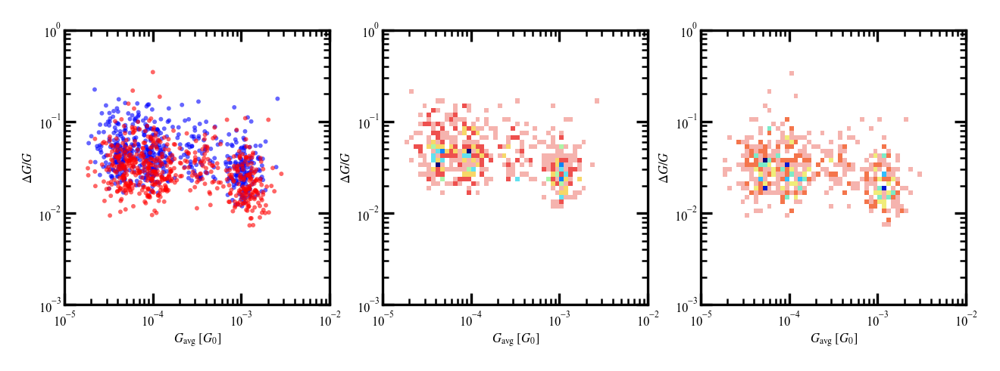

In [28]:
fig, ax = plt.subplots(ncols=3, figsize=utils.cm2inch(13, 4), dpi=300)
for i in range(3):
    ax[i].set_xscale('log')
    ax[i].set_yscale('log')

    ax[i].xaxis.set_ticks_position('both')
    ax[i].yaxis.set_ticks_position('both')
    
    ax[i].set_xlabel(r'$G_{\mathrm{avg}}\;[G_{0}]$')
    ax[i].set_ylabel(r'$\Delta G / G$')

ax[0].scatter(meas_sim_filt['G_avg_1 [G0]'], meas_sim_filt['DeltaG/G 1'], s=2, c='b', alpha=0.6, edgecolor='None')
ax[0].scatter(meas_sim_filt['G_avg_2 [G0]'], meas_sim_filt['DeltaG/G 2'], s=2, c='r', alpha=0.6, edgecolor='None')
ax[0].set_xlim(1e-5, 1e-2)
ax[0].set_ylim(1e-3, 1)

x_mesh, y_mesh, hist_2d_1 = utils.calc_hist_2d_single(x=meas_sim_filt['G_avg_1 [G0]'], y=meas_sim_filt['DeltaG/G 1'],
                                                      xrange=(1e-5, 1e-2), log_scale_x=True,
                                                      yrange=(1e-3, 1), log_scale_y=True,
                                                      num_bins= (20, 20),
                                                      bin_mode_x='decade',
                                                      bin_mode_y='decade')

x_mesh, y_mesh, hist_2d_2 = utils.calc_hist_2d_single(x=meas_sim_filt['G_avg_2 [G0]'], y=meas_sim_filt['DeltaG/G 2'],
                                                      xrange=(1e-5, 1e-2), log_scale_x=True,
                                                      yrange=(1e-3, 1), log_scale_y=True,
                                                      num_bins= (20, 20),
                                                      bin_mode_x='decade',
                                                      bin_mode_y='decade')

im1 = ax[1].pcolormesh(x_mesh, y_mesh, hist_2d_1, cmap= utils.cmap_geo32)

im2 = ax[2].pcolormesh(x_mesh, y_mesh, hist_2d_2, cmap= utils.cmap_geo32)

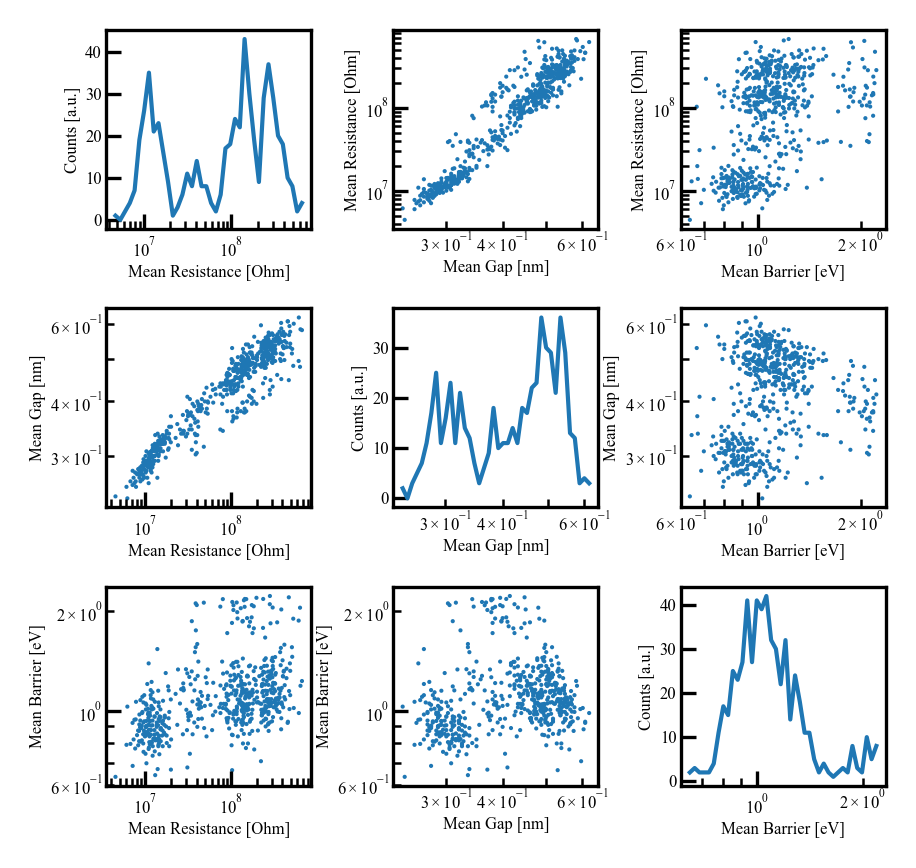

In [29]:
select_columns = ('Mean Resistance [Ohm]', 'Mean Gap [nm]', 'Mean Barrier [eV]')

axs=scatter_plot_matrix(data=meas_sim_filt, col_names=select_columns, set_log=(True, )*len(select_columns), set_limits=None,
                        hue=None, cmap = colormaps['Reds'], cmap_reversed=False, bins_num=40,
                        figsize=None, dpi=300, min_plot_size=utils.cm2inch(8, 8), s=1, edgecolor='None')

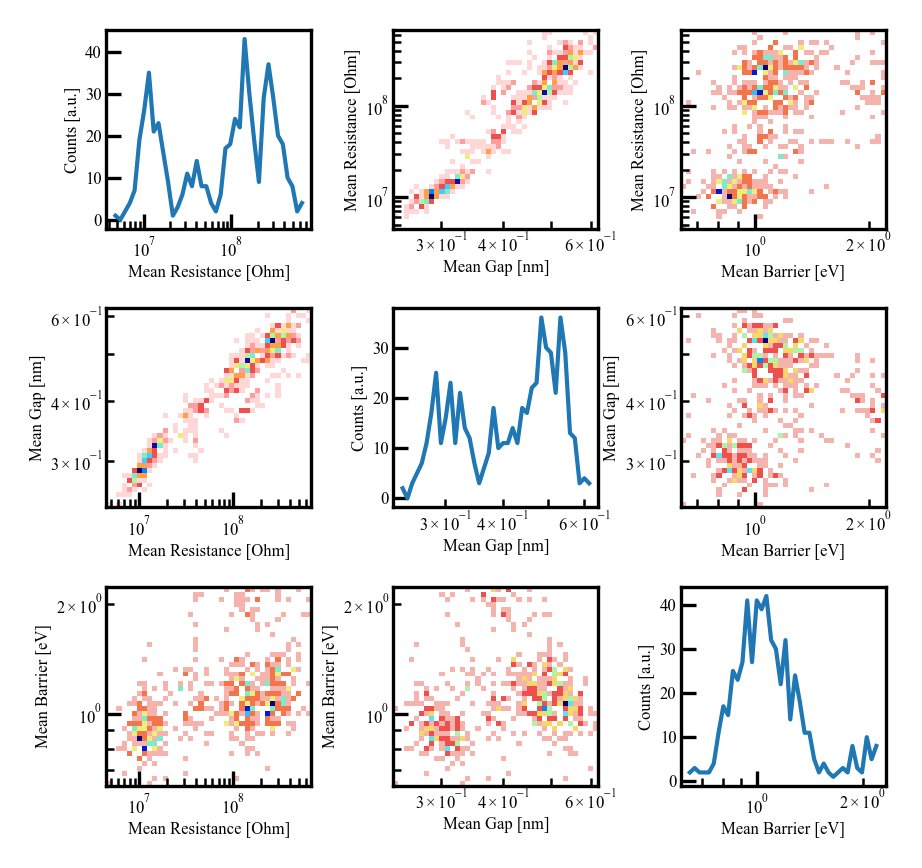

In [30]:
axs =  hist_2d_plot_matrix(data = meas_sim_filt, col_names=select_columns,
                           set_log=(True, )*len(select_columns), dpi=300, bins_num=40)

In [31]:
pd.read_excel(io=home_folder.joinpath('results/IVs/selected/Tunnel_22_02_03_push_fitIV_data_selected.xlsx'),
                          sheet_name=f'tr{24044}')

,V [V],I [A]
0,0.000,0.000000e+00
1,0.005,3.186698e-11
2,0.010,6.415033e-11
3,0.015,9.649807e-11
4,0.020,1.285166e-10
...,...,...
1799,-0.020,-1.555961e-10
1800,-0.015,-1.156281e-10
1801,-0.010,-7.683565e-11
1802,-0.005,-3.813350e-11


In [39]:
utils.reds[::2]

['#330000', '#990000', '#ff0000']

In [43]:
print(min(iv_df['V [V]']))
print(min(hold_trace.iv_bias_push))

-2.25
-0.7012417


0.42047991775042093
0.3285237646291994
0.3417584855529714


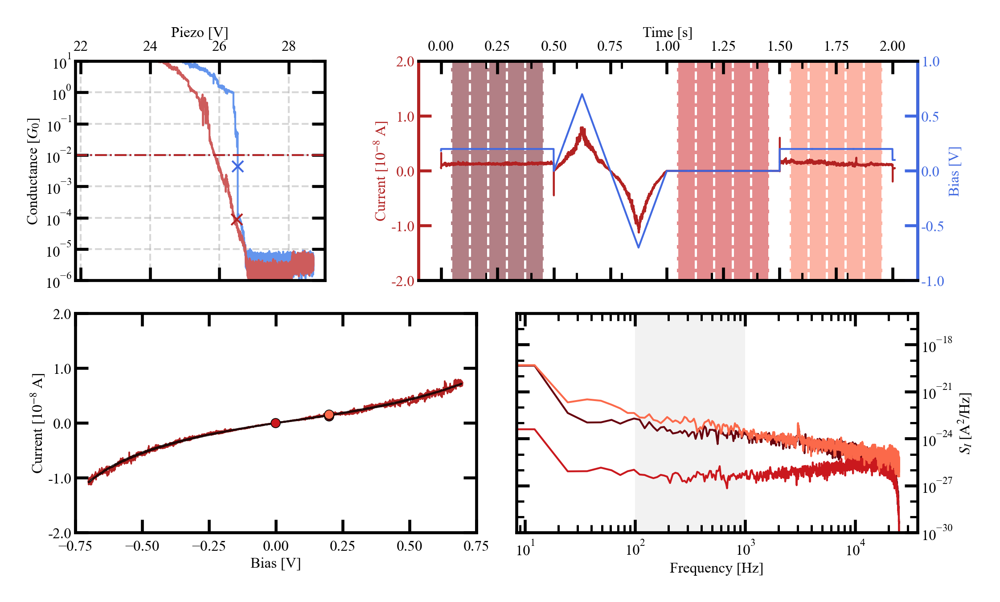

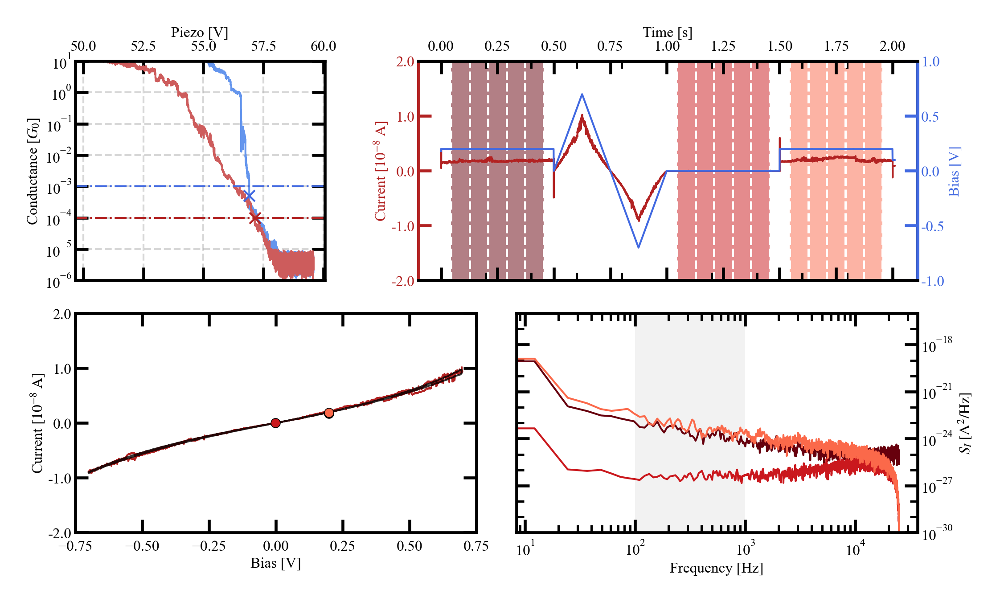

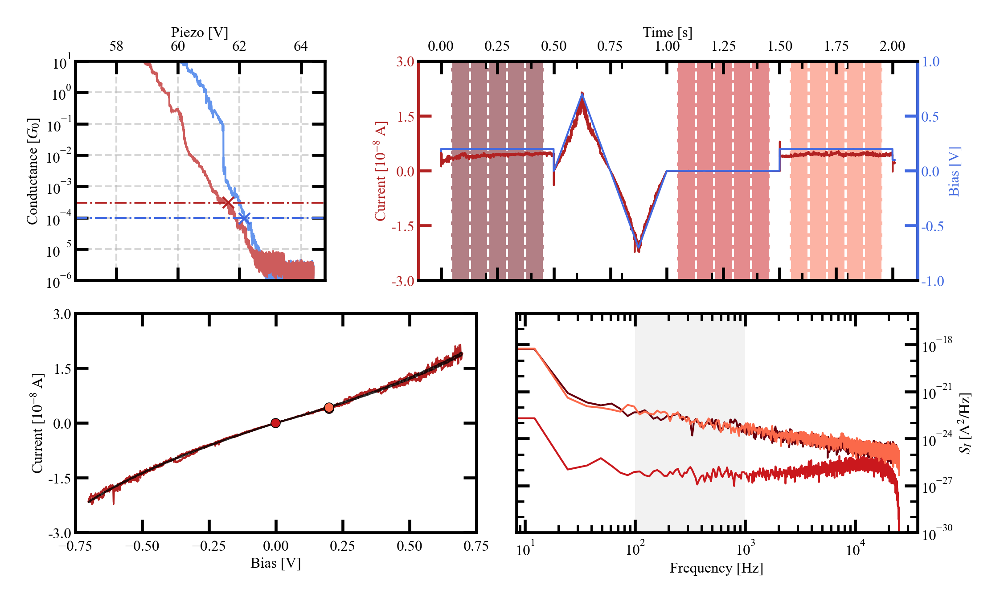

In [61]:
# selected_ivs = [24044, 25033, 30736, 30981, 41442, 43008]
selected_ivs = [24044, 30981, 43008]

my_colors = colormaps['Reds'](np.linspace(0.5, 1, 3))[::-1]

for which_trace in selected_ivs:
    # which_trace = which_traces[0]

    hold_trace = HoldTrace(which_trace,
                           load_from=home_folder, bias_offset=0,
                           r_serial_ohm=99_900, min_step_len=20_000, min_height=1, iv=0)

    trace_pair = TracePair(which_trace, load_from=home_folder)
    hold_trace.analyse_hold_trace(num_of_fft=5, subtract_bg=False)

    fig, ax_trace, ax_hold, par_hold, ax_iv, ax_psd = \
    plots.plot_ivs_scheme_one(trace_pair=trace_pair, hold_trace=hold_trace, direction='push', color_list=my_colors, vline_color='white',
                              smoothing=10, which_psds=[0, 1, 2], fig_size = utils.cm2inch(10, 5.6))
    
    iv_df = pd.read_excel(io=home_folder.joinpath('results/IVs/selected/Tunnel_22_02_03_push_fitIV_data_selected.xlsx'),
                          sheet_name=f'tr{which_trace}')
    
    ax_iv.plot(iv_df['V [V]'][np.bitwise_and(iv_df['V [V]'] > min(hold_trace.iv_bias_push), iv_df['V [V]'] < max(hold_trace.iv_bias_push))],
               iv_df['I [A]'][np.bitwise_and(iv_df['V [V]'] > min(hold_trace.iv_bias_push), iv_df['V [V]'] < max(hold_trace.iv_bias_push))], lw=0.5, alpha=0.8, c='k')
    ax_iv.set_xlim(-0.75, 0.75)
    ax_iv.set_xticks(np.arange(-0.75, 1, 0.25))
    # ax_iv.set_xlim(-1, 1)
    
#     ax_noise_1 = ax_iv.inset_axes(bounds=(0.05, 0.55, 0.4, 0.4))
#     ax_noise_2 = ax_iv.inset_axes(bounds=(0.55, 0.05, 0.4, 0.4))

#     # scaling_factor = 10 ** (2 * np.log10(hold_trace.bias_steps[hold_trace.bias_steps > 0]))[0] / np.sort(
#     #     hold_trace.areas_push[np.bitwise_and(hold_trace.bias_steps > 0, hold_trace.bias_steps < 0.11)])[1]

#     # ax_noise_1.plot(hold_trace.bias_steps[hold_trace.bias_steps > 0],
#     #                 10 ** (2 * np.log10(hold_trace.bias_steps[hold_trace.bias_steps > 0])) / scaling_factor, ls='-',
#     #                 lw=0.5, c='k')

    for i in range(len(my_colors)):
        ax_iv.plot(hold_trace.bias_steps[i], hold_trace.avg_current_on_step_push[i], marker='o', ls='', ms=2.5,
                   markeredgecolor='k', markeredgewidth=0.2, c=my_colors[i])
#         ax_noise_1.plot(hold_trace.bias_steps[i], hold_trace.areas_push[i], marker='o', ls='', ms=2.5,
#                         markeredgecolor='k', markeredgewidth=0.2, c=my_colors[i])
#         ax_noise_2.plot(hold_trace.bias_steps[i], hold_trace.current_noise_push[i], marker='o', ls='', ms=2.5,
#                         markeredgecolor='k', markeredgewidth=0.2, c=my_colors[i])

#     ax_noise_1.set_xlabel('Bias [V]')
#     ax_noise_2.set_xlabel('Bias [V]')

#     ax_noise_1.set_ylabel(r'$\Delta I^2 [\mathrm{A}^2]$')
#     ax_noise_2.set_ylabel(r'$\Delta I/I$')

#     ax_noise_1.set_xscale('log')
#     ax_noise_1.set_yscale('log')
#     ax_noise_2.set_xscale('log')
#     ax_noise_2.set_yscale('log')

#     ax_noise_1.xaxis.set_ticks_position('both')
#     ax_noise_1.yaxis.tick_right()
#     ax_noise_1.yaxis.set_label_position('right')
#     ax_noise_1.yaxis.set_ticks_position('both')

#     ax_noise_2.xaxis.tick_top()
#     ax_noise_2.xaxis.set_label_position('top')
#     ax_noise_2.xaxis.set_ticks_position('both')
#     ax_noise_2.yaxis.set_ticks_position('both')

#     ax_noise_1.set_ylim(10 ** min(np.floor(np.log10(hold_trace.areas_push[hold_trace.bias_steps > 0]))),
#                         10 ** max(np.ceil(np.log10(hold_trace.areas_push))))

#     ax_noise_1.tick_params(axis='x', labelsize=4)
#     ax_noise_1.tick_params(axis='y', labelsize=4)
#     ax_noise_2.tick_params(axis='x', labelsize=4)
#     ax_noise_2.tick_params(axis='y', labelsize=4)
    
    # fig.suptitle(f'Trace {which_trace}', fontsize=6)
    plt.savefig(home_folder.joinpath(f'results/article/Fig3_{which_trace}_with_avg_current.png'), bbox_inches='tight')
    
    print(filter_traces.iv_difference(hold_trace, direction='push', smoothing=100))

In [59]:
hold_trace.bias_steps

array([ 0.19875221, -0.00126   ,  0.19875221], dtype=float32)

0.3331695492937943


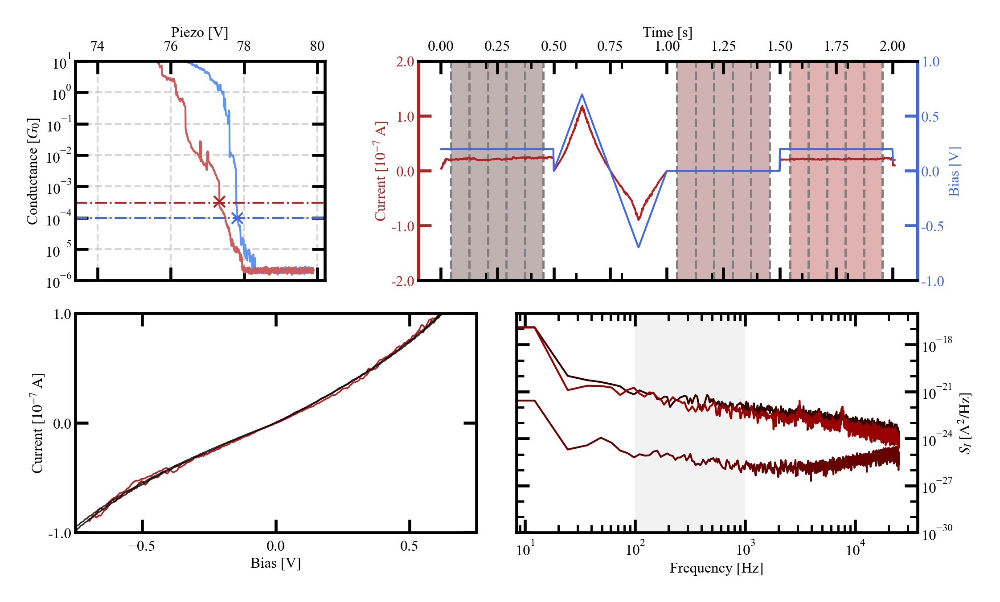

In [66]:
selected_ivs = [24044, 25033, 30736, 30981, 41442, 43008]

which_trace = selected_ivs[4]
# which_trace = which_traces[0]

hold_trace = HoldTrace(which_trace,
                       load_from=home_folder, bias_offset=0,
                       r_serial_ohm=99_900, min_step_len=20_000, min_height=1, iv=0)

trace_pair = TracePair(which_trace, load_from=home_folder)
hold_trace.analyse_hold_trace(num_of_fft=5, subtract_bg=True)

ax_trace, ax_hold, par_hold, ax_iv, ax_psd = \
plots.plot_ivs_scheme_one(trace_pair=trace_pair, hold_trace=hold_trace, direction='push',
                          smoothing=100, which_psds=[0, 1, 2], fig_size = utils.cm2inch(10, 5.6))

iv_df = pd.read_excel(io=home_folder.joinpath('results/IVs/selected/Tunnel_22_02_03_push_fitIV_data_selected.xlsx'),
                      sheet_name=f'tr{which_trace}')

ax_iv.plot(iv_df['V [V]'], iv_df['I [A]'], lw=0.4, alpha=0.8, c='k')
ax_iv.set_xlim(-0.75, 0.75)
ax_iv.set_ylim(-1e-7, 1e-7)

plt.savefig(home_folder.joinpath(f'results/IVs/selected/partial_tunnel_push_fits_{which_trace}.png'), bbox_inches='tight')

print(filter_traces.iv_difference(hold_trace, direction='push', smoothing=100))

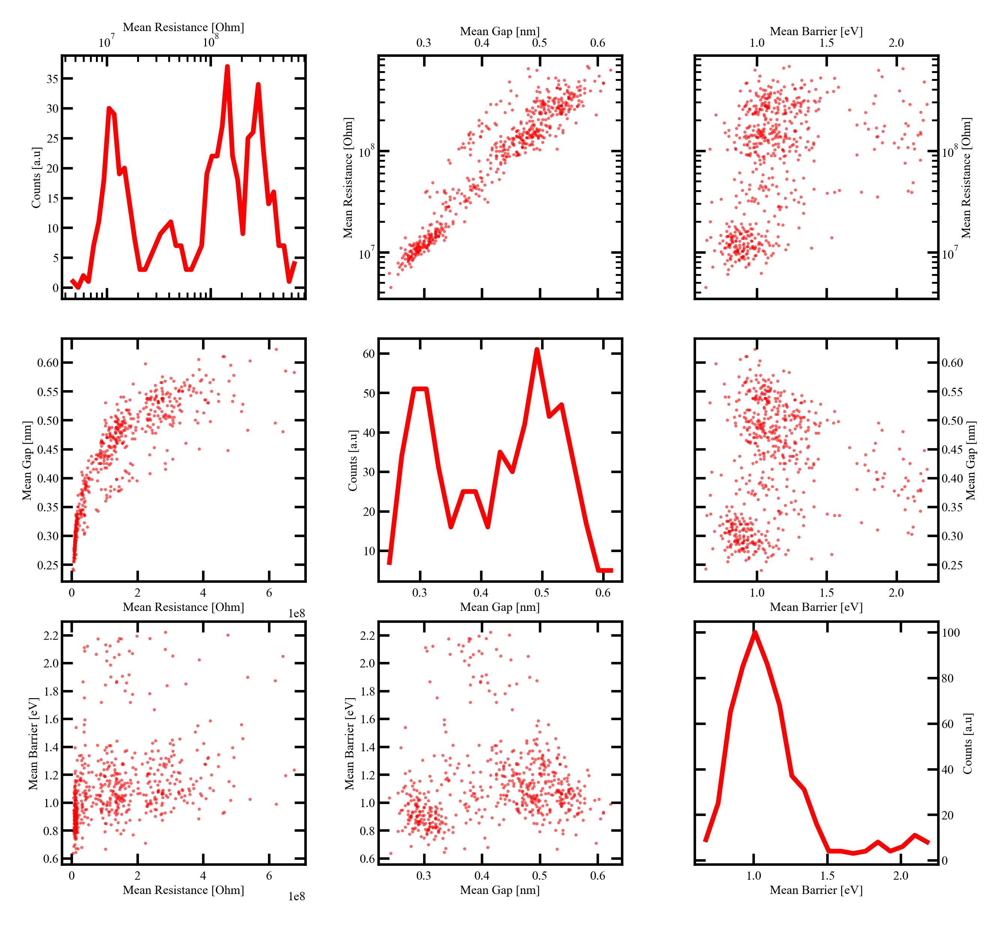

In [31]:
# def scatter_plot_matrix(data: pd.DataFrame, hue: Optional[str] = None,
#                    log_x: bool = False, log_y: bool = False,
#                    cmap = utils.cmap_geo32, figsize : Optional[Tuple[float, float]] = None, min_plot_size=utils.cm2inch(3, 3), dpi=300):

data = meas_sim_filt[['Mean Resistance [Ohm]', 'Mean Gap [nm]', 'Mean Barrier [eV]']]
log_x = (True, False, False)
log_y = (True, False, False)
cmap = colormaps['Reds']
figsize=None
min_plot_size=utils.cm2inch(4, 4)
dpi=600

column_names = list(data.columns)
num_columns = len(data.columns)

if figsize == None:
    figsize = (1.1 * num_columns * min_plot_size[0], num_columns * min_plot_size[1])

fig = plt.figure(figsize=figsize, dpi=dpi)  # figsize: (width, height) in inches
gs = gridspec.GridSpec(nrows=num_columns, ncols=num_columns, width_ratios=num_columns*(1,), height_ratios=num_columns*(1,),
                       figure=fig, left=0.2, right=0.95, top=0.95, bottom=0.15, wspace=0.3, hspace=0)

axs = []

for i in range(num_columns):
    for j in range(num_columns):
        axs.append(fig.add_subplot(gs[i, j]))
        axs[-1].set_box_aspect(1)
        if log_x[i]:
                axs[i].set_xscale('log')
        if i != j:
            if log_y[j]:
                axs[i].set_yscale('log')

bins_col = []
hist_1d_col = []
                
for i, row in enumerate(column_names):
    for j, col in enumerate(column_names):            
        if i == 0:
            axs[i * num_columns + j].xaxis.tick_top()
            axs[i * num_columns + j].xaxis.set_label_position('top')
        if j == num_columns-1:
            axs[i * num_columns + j].yaxis.tick_right()
            axs[i * num_columns + j].yaxis.set_label_position('right')

        if i == j:
            # plot 1d histogram of column for each category based on hue
            bins, hist_1d = utils.calc_hist_1d_single(data=data[col],
                                                      xrange=(min(data[col]), max(data[col])),
                                                      xbins_num = 20, log_scale = log_x[i], bin_mode='decade')
            bins_col.append(bins)
            hist_1d_col.append(hist_1d)
            if log_y[j]:
                axs[i * num_columns + j].set_xscale('log')
            axs[i * num_columns + j].plot(bins_col[-1], hist_1d_col[-1], color='r')
            # axs[i * num_columns + j].legend(fontsize=3, handlelength=1, frameon=False)
            axs[i * num_columns + j].set_xlabel(col)
            axs[i * num_columns + j].set_ylabel('Counts [a.u]')
        else:
            axs[i * num_columns + j].scatter(data[col],
                                             data[row],
                                             color='r', s=1, alpha=0.6, edgecolor='None')
            axs[i * num_columns + j].set_xlabel(col)
            axs[i * num_columns + j].set_ylabel(row)

        axs[i * num_columns + j].xaxis.set_ticks_position('both')
        axs[i * num_columns + j].yaxis.set_ticks_position('both')
            
# plt.savefig(home_folder.joinpath(f'results/IVs/selected/partial_tunnel_push_fits.png'), bbox_inches='tight') 

In [38]:
# for which_trace in tqdm(meas_sim_filt['Trace Index'].astype(int)):
#     hold_trace = HoldTrace(which_trace,
#                            load_from=home_folder, bias_offset=0,
#                            r_serial_ohm=99_900, min_step_len=20_000, min_height=1, iv=0)

#     trace_pair = TracePair(which_trace, load_from=home_folder)
#     hold_trace.analyse_hold_trace(num_of_fft=5, subtract_bg=True)

#     plots.plot_ivs_scheme_one(trace_pair=trace_pair, hold_trace=hold_trace, direction='push',
#                               smoothing=10, which_psds=[0, 1, 2], fig_size = utils.cm2inch(10, 5.6))

#     # print(filter_traces.iv_difference(hold_trace, direction='push', smoothing=100))
#     plt.savefig(home_folder.joinpath(f'results/IVs/simulation_filtered_IV/IV_{which_trace}.png'), bbox_inches='tight')
#     plt.close()

In [33]:
# import shutil
# with open(home_folder.joinpath('results/IVs/simulation_filtered_IV/hand_selected.txt')) as f:
#     for i in tqdm(list(map(lambda x: x.strip(), f.readlines()))):
#         shutil.copy(src=home_folder.joinpath('results/IVs/simulation_filtered_IV/IV_'+i+'.png'),
#                     dst=home_folder.joinpath('results/IVs/simulation_filtered_IV/hand_selected/'))

In [34]:
which_traces = np.random.choice(meas_sim_filt['Trace Index'], size=20).astype(int)

In [35]:
which_traces

array([34682, 38126, 41442, 35550, 25384, 34362, 27972, 27755, 27010,
       27218, 35744, 20910, 24916, 28065, 34426, 36661, 37804, 28376,
       40130, 28327])

0.38254885435878094
0.2828317505447622
0.3331695492937943
0.27685683934796934
0.3377333586336614
0.47048332959431255
0.44724172915049265
0.3098068655744416
0.4198714559763628
0.42646581007862727
0.25535232649776596
0.3379474071423782
0.2477225449044017
0.4453198589179146
0.3491548472374077
0.3877095503110718
0.30840656015710993
0.4097577979601351
0.3222553111233485
0.2938029975166231


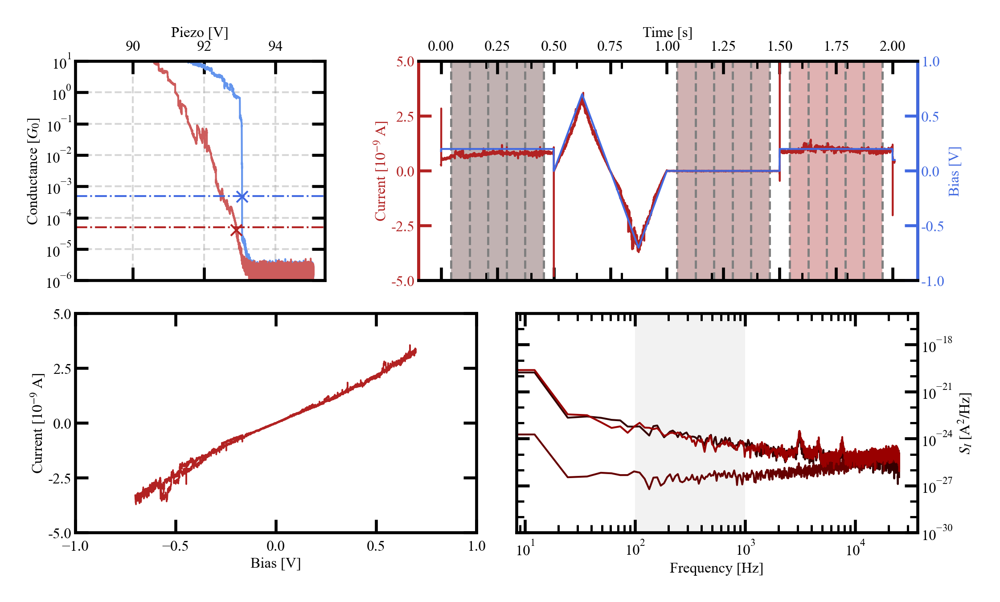

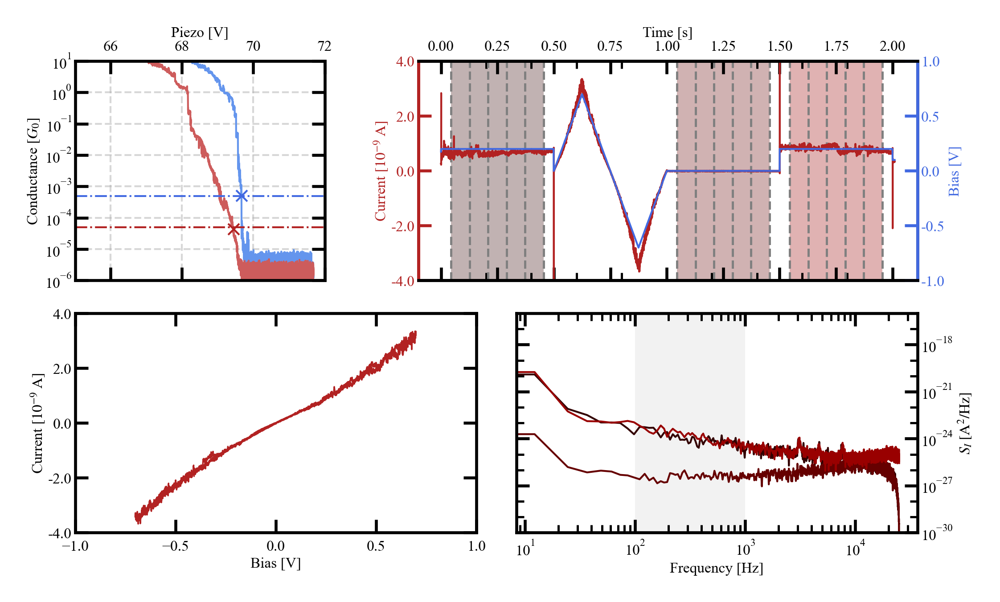

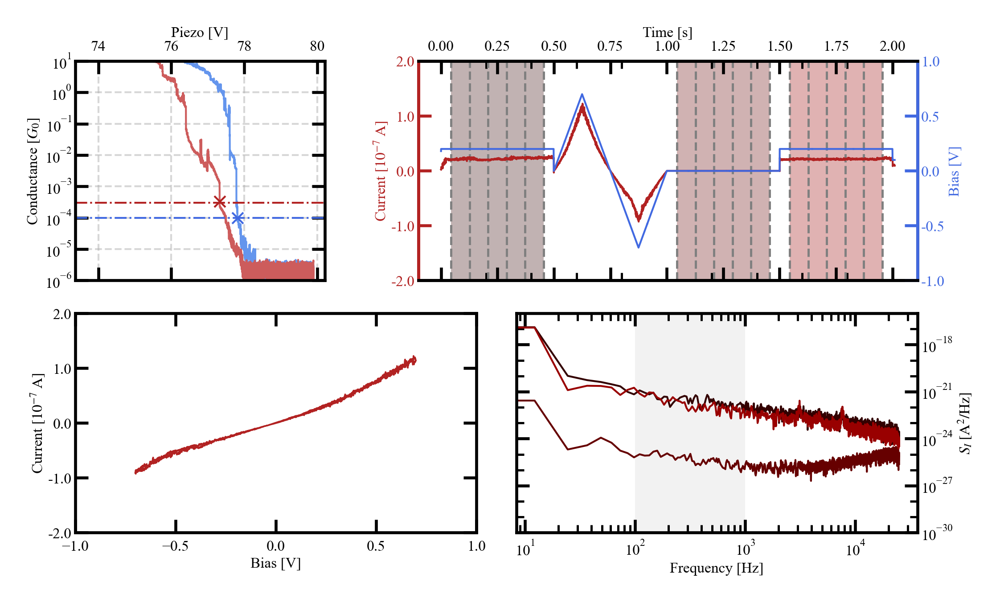

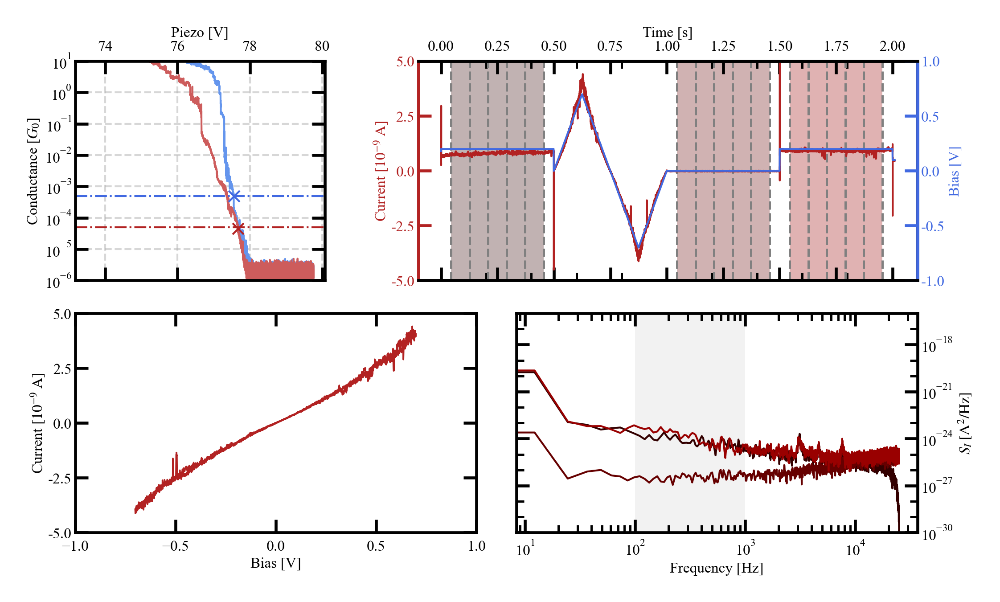

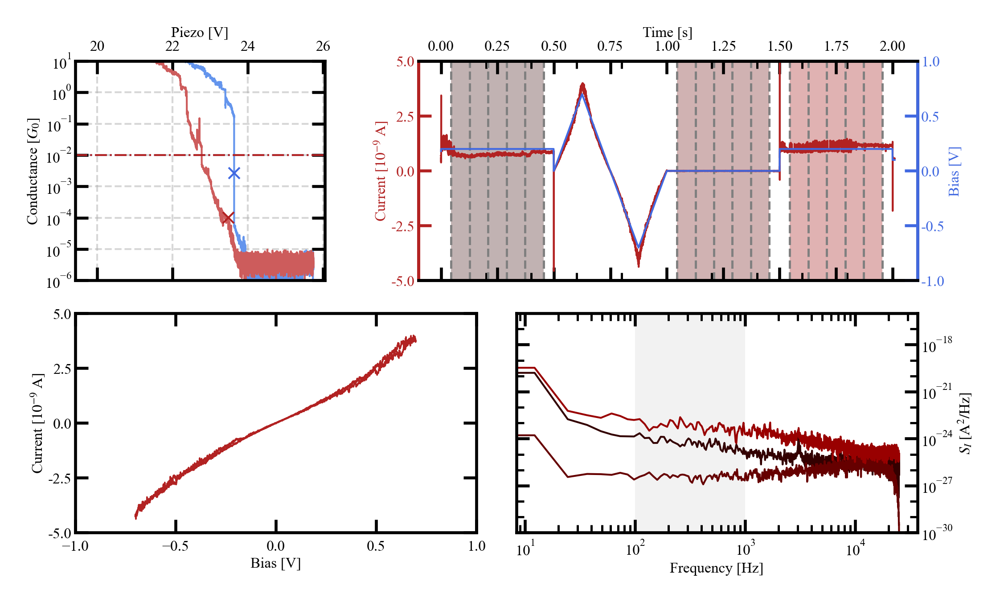

...

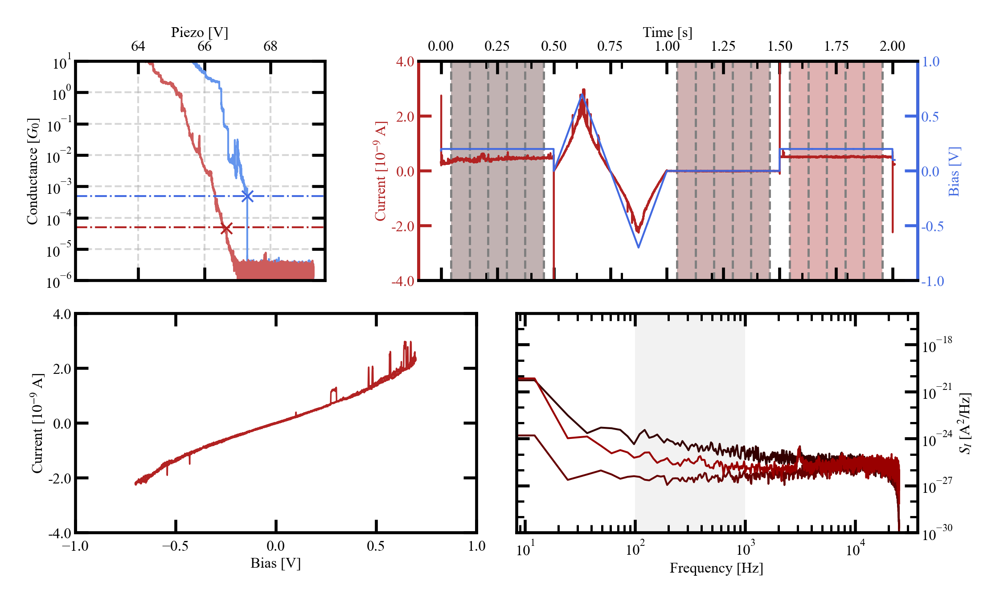

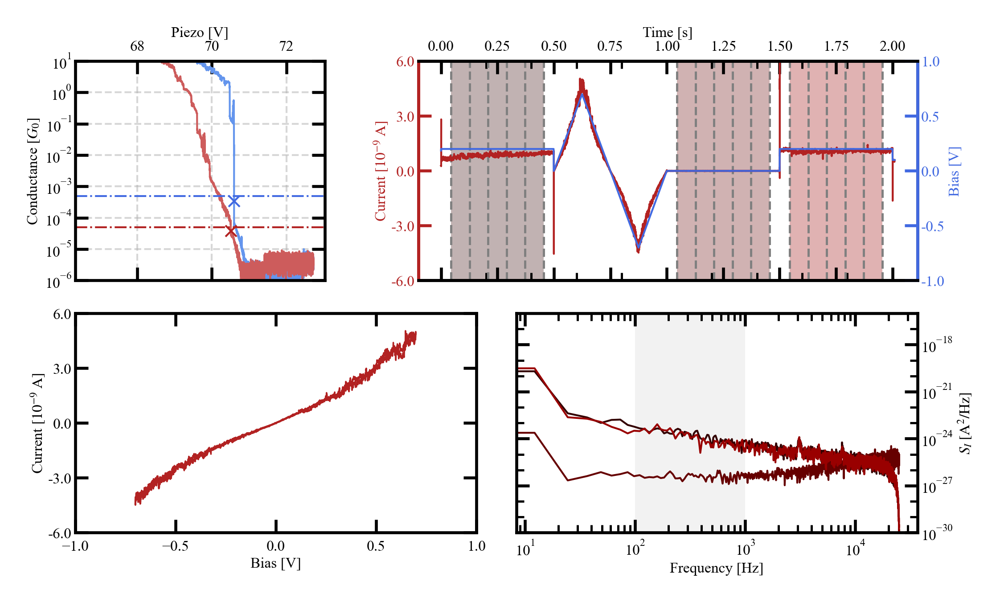

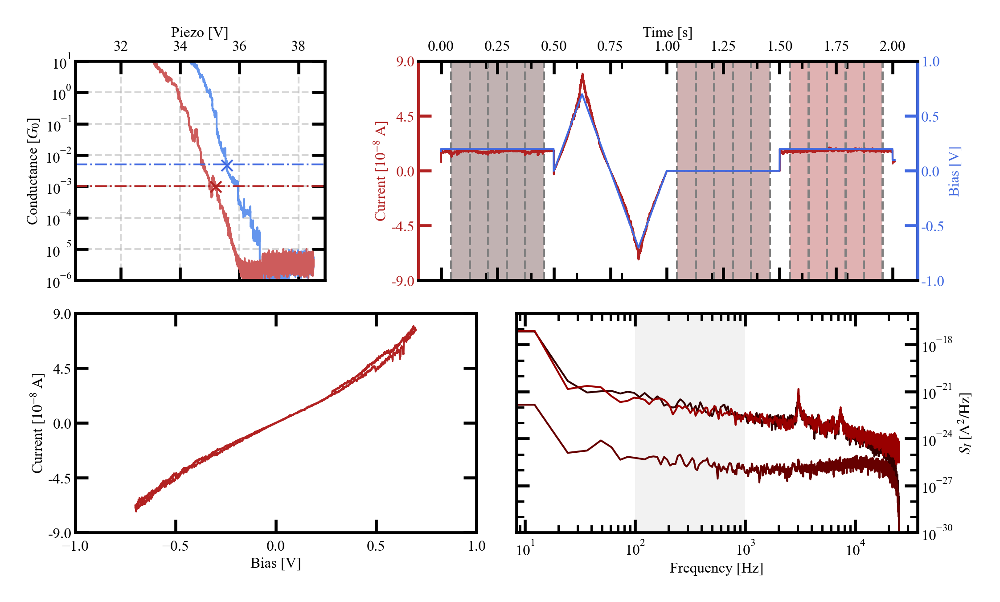

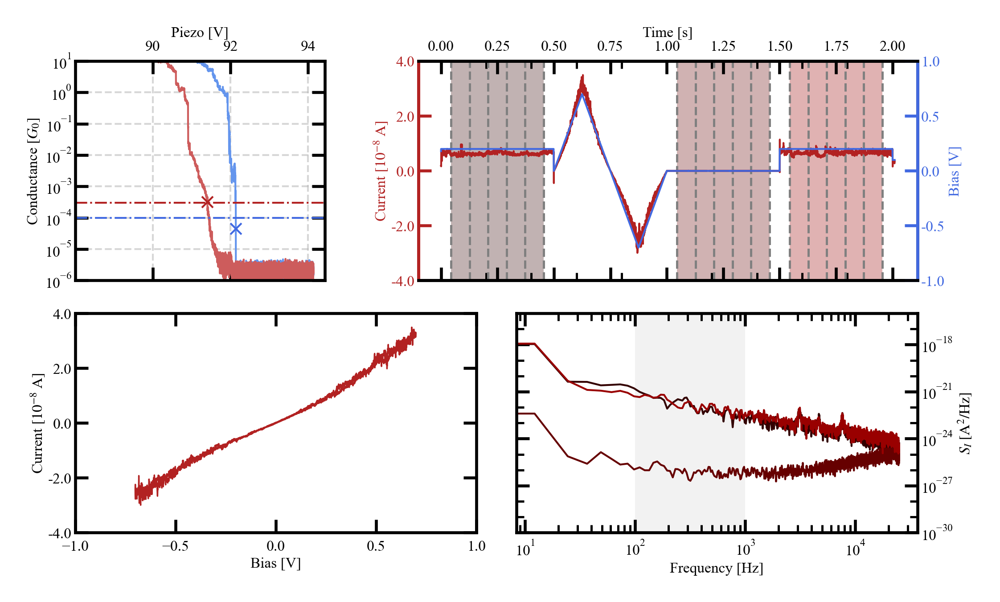

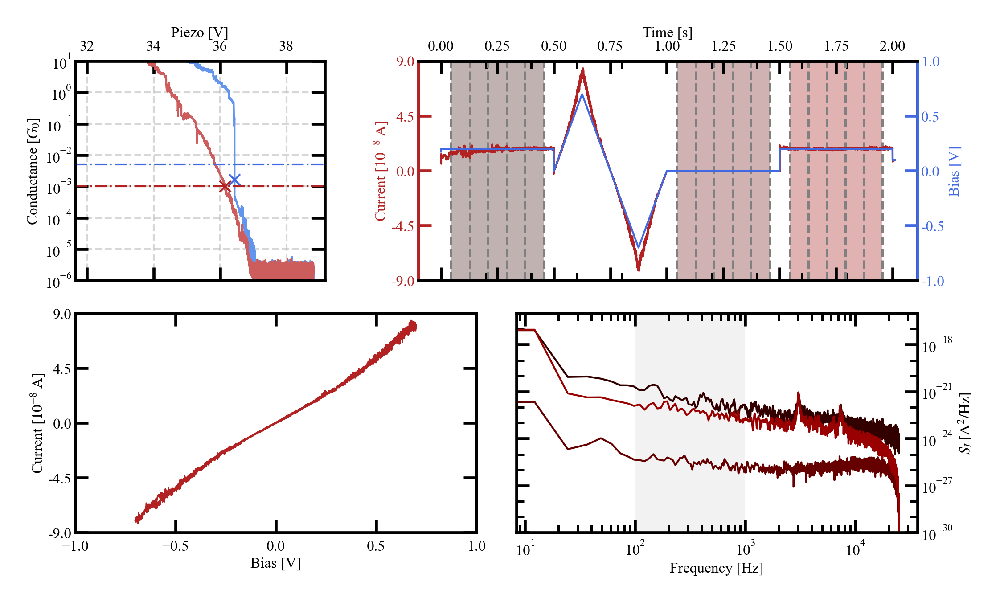

In [37]:
for which_trace in which_traces:
    # which_trace = which_traces[0]

    hold_trace = HoldTrace(which_trace,
                           load_from=home_folder, bias_offset=0,
                           r_serial_ohm=99_900, min_step_len=20_000, min_height=1, iv=0)

    trace_pair = TracePair(which_trace, load_from=home_folder)
    hold_trace.analyse_hold_trace(num_of_fft=5, subtract_bg=True)

    plots.plot_ivs_scheme_one(trace_pair=trace_pair, hold_trace=hold_trace, direction='push',
                              smoothing=10, which_psds=[0, 1, 2], fig_size = utils.cm2inch(10, 5.6))

    print(filter_traces.iv_difference(hold_trace, direction='push', smoothing=100))

*************************************

In [293]:
tunnel_push_fits_quarters_filt = tunnel_push_fits_quarters[(tunnel_push_fits_quarters['barrier_0'] < 2) & (tunnel_push_fits_quarters['barrier_1'] < 2) &
                                                           (tunnel_push_fits_quarters['barrier_2'] < 2) & (tunnel_push_fits_quarters['barrier_3'] < 2)]

In [294]:
data_dict = {}
for i in range(4):
    data_dict[f'resistance_{i}'] = abs((tunnel_push_fits_quarters_filt['resistance_mean'] - tunnel_push_fits_quarters_filt[f'resistance_{i}'])) / tunnel_push_fits_quarters_filt['resistance_mean']
    data_dict[f'gap_{i}'] = abs((tunnel_push_fits_quarters_filt['gap_mean'] - tunnel_push_fits_quarters_filt[f'gap_{i}'])) / tunnel_push_fits_quarters_filt['gap_mean']
    data_dict[f'barrier_{i}'] = abs((tunnel_push_fits_quarters_filt['barrier_mean'] - tunnel_push_fits_quarters_filt[f'barrier_{i}'])) / tunnel_push_fits_quarters_filt['barrier_mean']

In [295]:
tunnel_push_fits_quarters_mean_diff = pd.DataFrame(data=data_dict)

In [296]:
tunnel_push_fits_quarters_mean_diff

,resistance_0,gap_0,barrier_0,resistance_1,gap_1,barrier_1,resistance_2,gap_2,barrier_2,resistance_3,gap_3,barrier_3
0,0.042027,0.017143,0.055449,0.021142,0.062857,0.177820,0.002024,0.017143,0.032505,0.018861,0.097143,0.265774
1,0.045937,0.004695,0.029240,0.052822,0.032864,0.076023,0.129383,0.079812,0.181287,0.030623,0.051643,0.134503
2,0.062155,0.161290,0.521989,0.014672,0.010753,0.021033,0.032629,0.053763,0.181644,0.014853,0.118280,0.319312
3,0.067220,0.000000,0.047059,0.073860,0.020408,0.011765,0.020685,0.061224,0.188235,0.161766,0.081633,0.152941
14,0.141281,0.017964,0.111517,0.088833,0.065868,0.257770,0.095369,0.077844,0.261426,0.134745,0.005988,0.107861
...,...,...,...,...,...,...,...,...,...,...,...,...
2059,0.042035,0.054545,0.165312,0.005132,0.018182,0.089431,0.063338,0.090909,0.311653,0.026435,0.018182,0.056911
2061,0.049686,0.098039,0.325843,0.037153,0.019608,0.182022,0.064730,0.176471,0.725843,0.052198,0.058824,0.217978
2062,0.047329,0.016393,0.109718,0.078020,0.016393,0.021944,0.078557,0.016393,0.015674,0.046793,0.016393,0.115987
2064,0.012465,0.000000,0.027933,0.095801,0.100000,0.251397,0.067430,0.066667,0.184358,0.015907,0.033333,0.094972


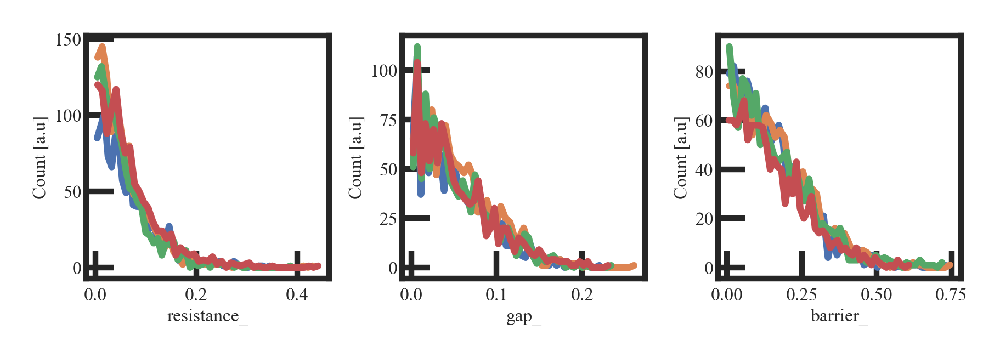

In [316]:
fig = plt.figure(figsize=utils.cm2inch(9, 3), dpi=dpi)  # figsize: (width, height) in inches
gs = gridspec.GridSpec(nrows=1, ncols=3,
                       figure=fig, left=0.2, right=0.95, top=0.95, bottom=0.15, wspace=0.3, hspace=0)

bins_dict = {}
hist_1d_dict = {}
axs=[]

data = tunnel_push_fits_quarters_mean_diff

for ind, val in enumerate(('resistance_', 'gap_', 'barrier_')):
    axs.append(fig.add_subplot(gs[ind]))
    for i in range(4):
        bins, hist_1d = utils.calc_hist_1d_single(data=data[val+str(i)],
                                                  xrange=(min(data[val+str(i)]), max(data[val+str(i)])),
                                                  xbins_num = 50, log_scale = False, bin_mode='decade')
        
        bins_dict[val+str(i)] = bins
        hist_1d_dict[val+str(i)] = hist_1d
        
        axs[ind].set_box_aspect(1)
        axs[ind].plot(bins_dict[val+str(i)], hist_1d_dict[val+str(i)])
        axs[ind].set_xlabel(val)
        axs[ind].set_ylabel('Count [a.u]')

In [161]:
traces = np.array(tunnel_push_fits.index%2066+1)

In [176]:
tunnel_push_fits.iloc[np.where(traces==2066)].mean()

Resistance [Ohm]    1.394562e+07
Gap [nm]            3.375000e-01
Barrier [eV]        6.700000e-01
IV part             1.500000e+00
dtype: float64

In [100]:
tunnel_push_fits[tunnel_push_fits['IV part']==3]['Resistance [Ohm]']

6198    1.160831e+08
6199    1.706169e+08
6200    1.584039e+08
6201    1.196429e+08
6202    1.276993e+08
            ...     
8259    7.941217e+06
8260    1.187940e+07
8261    1.506671e+07
8262    1.157602e+07
8263    1.258852e+07
Name: Resistance [Ohm], Length: 2066, dtype: float64

In [101]:
for i in tunnel_push_fits.columns[tunnel_push_fits.columns != 'IV part']:
    print(i)

Resistance [Ohm]
Gap [nm]
Barrier [eV]


In [102]:
list(tunnel_push_fits.columns[tunnel_push_fits.columns != 'IV part'])

['Resistance [Ohm]', 'Gap [nm]', 'Barrier [eV]']

In [71]:
tunnel_push_fits.columns

Index(['Resistance [Ohm]', 'Gap [nm]', 'Barrier [eV]', 'IV part'], dtype='object')

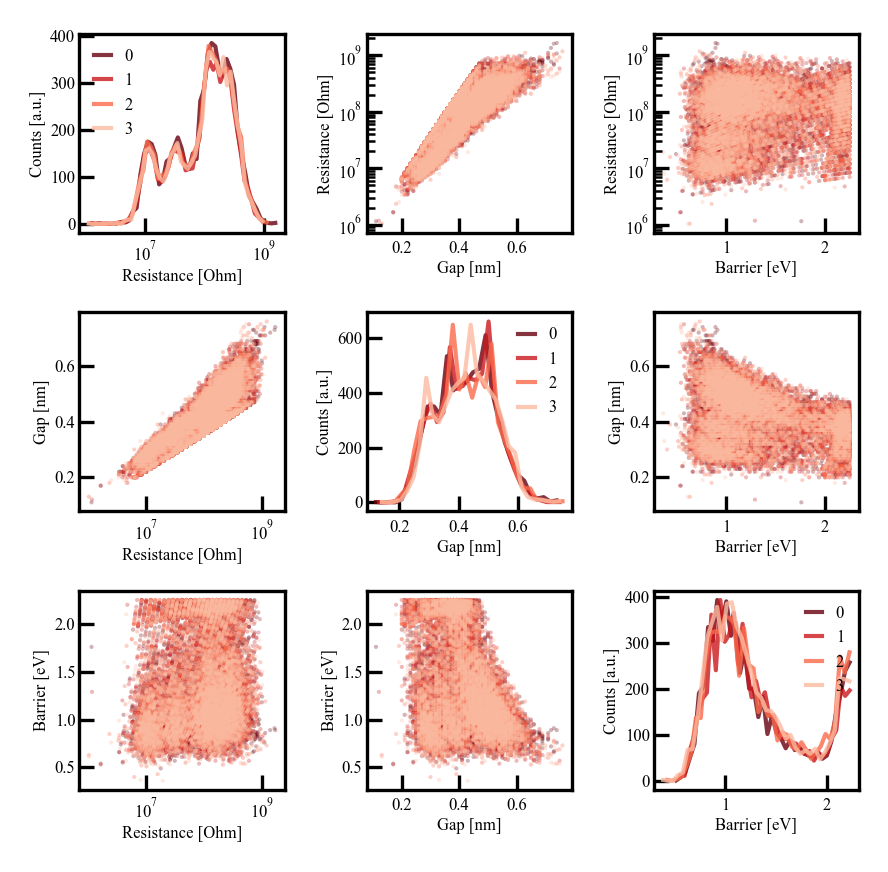

In [74]:
axs = scatter_plot_matrix(data=tunnel_push_fits, col_names=('Resistance [Ohm]', 'Gap [nm]', 'Barrier [eV]'), set_log=(True, False, False), hue='IV part',
                          figsize=None, dpi=300, s=1, edgecolor='None', alpha=0.3, bins_num=(50, 30, 40), cmap_reversed=True)

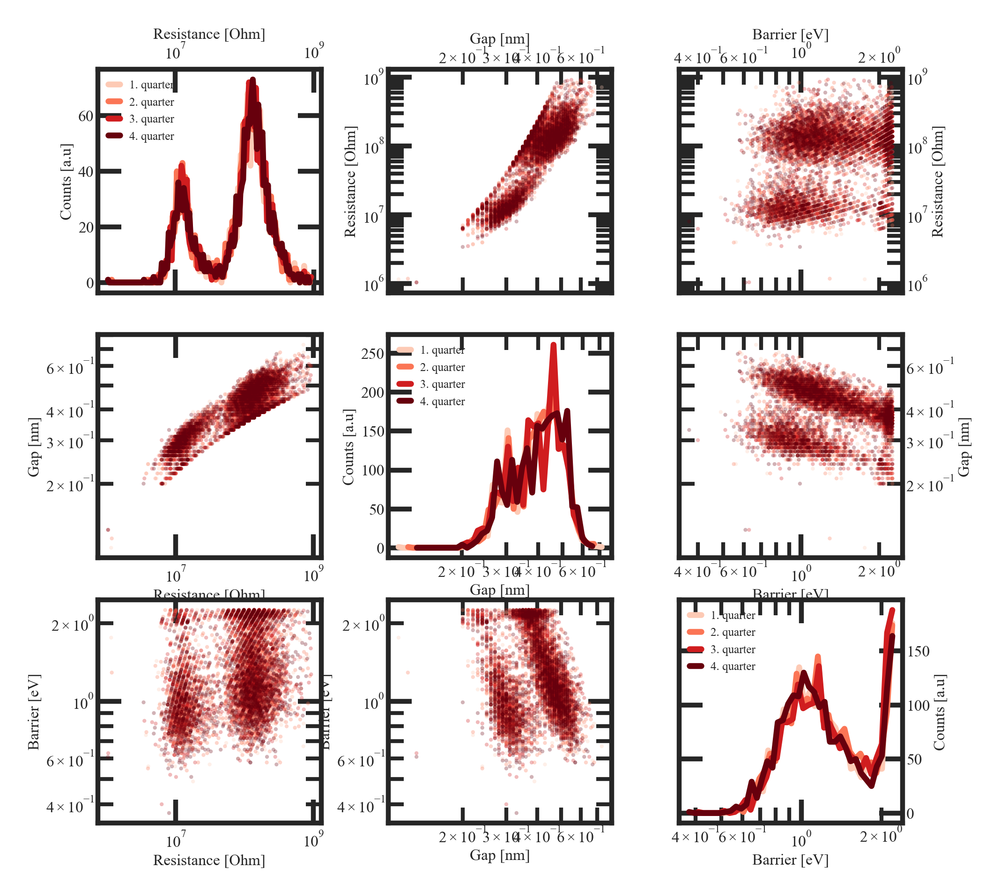

In [144]:
# def scatter_plot_matrix(data: pd.DataFrame, hue: Optional[str] = None,
#                    log_x: bool = False, log_y: bool = False,
#                    cmap = utils.cmap_geo32, figsize : Optional[Tuple[float, float]] = None, min_plot_size=utils.cm2inch(3, 3), dpi=300):

data = tunnel_push_fits
hue = 'IV part'
log_x = True
log_y = True
cmap = colormaps['Reds']
figsize=None
min_plot_size=utils.cm2inch(3, 3)
dpi=600

if hue is None:
    num_categories = 1
else:
    categories = data[hue].unique()
    num_categories = data[hue].unique().shape[0]

column_names = list(data.columns[data.columns != hue])
num_columns = len(data.columns[data.columns != hue])

my_cmap = cmap(np.linspace(0.2, 1, num_categories))

if figsize == None:
    figsize = (1.1 * num_categories * min_plot_size[0], num_categories * min_plot_size[1])

fig = plt.figure(figsize=figsize, dpi=dpi)  # figsize: (width, height) in inches
gs = gridspec.GridSpec(nrows=num_categories, ncols=num_categories, width_ratios=num_categories*(1,), height_ratios=num_categories*(1,),
                       figure=fig, left=0.2, right=0.95, top=0.95, bottom=0.15, wspace=0.3, hspace=0)

axs = []

for i in range(num_columns):
    for j in range(num_columns):
        axs.append(fig.add_subplot(gs[i, j]))
        axs[-1].set_box_aspect(1)
        if i != j:
            if log_x:
                axs[-1].set_xscale('log')
            if log_y:
                axs[-1].set_yscale('log')

bins_cat = []
hist_1d_cat = []
                
for i, row in enumerate(column_names):
    for j, col in enumerate(column_names):
        for ind, cat in enumerate(categories):
            
            if i == 0:
                axs[i * num_columns + j].xaxis.tick_top()
                axs[i * num_columns + j].xaxis.set_label_position('top')
            if j == num_columns-1:
                axs[i * num_columns + j].yaxis.tick_right()
                axs[i * num_columns + j].yaxis.set_label_position('right')
            
            if i == j:
                # plot 1d histogram of column for each category based on hue
                bins, hist_1d = utils.calc_hist_1d_single(data=data[data[hue] == cat][col],
                                                          xrange=(min(data[data[hue] == cat][col]), max(data[data[hue] == cat][col])),
                                                          xbins_num = 50, log_scale = log_x, bin_mode='decade')
                bins_cat.append(bins)
                hist_1d_cat.append(hist_1d)
                if log_x:
                    axs[i * num_columns + j].set_xscale('log')
                axs[i * num_columns + j].plot(bins_cat[-1], hist_1d_cat[-1], color=my_cmap[cat], label=f'{ind+1}. quarter')
                axs[i * num_columns + j].legend(fontsize=3, handlelength=1, frameon=False)
                axs[i * num_columns + j].set_xlabel(col)
                axs[i * num_columns + j].set_ylabel('Counts [a.u]')
            else:
                axs[i * num_columns + j].scatter(data[data[hue] == cat][col],
                                                 data[data[hue] == cat][row],
                                                 color=my_cmap[cat], s=1, alpha=0.3, edgecolor='None')
                axs[i * num_columns + j].set_xlabel(col)
                axs[i * num_columns + j].set_ylabel(row)
                
            axs[i * num_columns + j].xaxis.set_ticks_position('both')
            axs[i * num_columns + j].yaxis.set_ticks_position('both')
            
# plt.savefig(home_folder.joinpath(f'results/IVs/selected/partial_tunnel_push_fits.png'), bbox_inches='tight') 

In [87]:
noise_data_push

,Trace Index,G_avg_1 [G0],Noise Power 1 [G0^2],DeltaG/G 1,DeltaI/I 1,G_avg_2 [G0],Noise Power 2 [G0^2],DeltaG/G 2,DeltaI/I 2
0,19515,0.000104,1.034398e-10,0.098067,0.098146,0.000115,2.828721e-11,0.046079,0.046120
1,19529,0.000081,3.261848e-11,0.070921,0.070965,0.000086,5.902757e-11,0.089175,0.089235
2,19535,0.000098,3.471378e-11,0.060375,0.060420,0.000077,1.038626e-10,0.131780,0.131859
3,19536,0.000123,1.708534e-10,0.105979,0.106080,0.000136,4.617942e-11,0.049800,0.049852
4,19568,0.000111,5.898702e-11,0.069067,0.069126,0.000122,9.207404e-11,0.078762,0.078836
...,...,...,...,...,...,...,...,...,...
6214,49057,0.000080,5.098413e-10,0.283386,0.283561,0.000102,2.012042e-10,0.138958,0.139068
6215,49067,0.000160,9.173187e-11,0.059936,0.060010,0.000397,3.471137e-10,0.046973,0.047117
6216,49072,0.000086,8.167860e-11,0.104733,0.104803,0.000123,8.194543e-11,0.073369,0.073439
6217,49083,0.000113,9.997313e-11,0.088571,0.088648,0.000294,2.459767e-09,0.168821,0.169205


In [101]:
tunnel_push_fits = pd.read_excel(io=home_folder.joinpath('results/IVs/selected/Tunnel_22_02_03_push_fits_all.xlsx'))
tunnel_push_fits['IV part'] = list(map(lambda x: int(re.search(r'(\d)_IV', x).group(1)), tunnel_push_fits['Fit Trace']))

In [102]:
tunnel_push_fits = tunnel_push_fits.sort_values(['Trace', 'IV part'])

In [103]:
tunnel_push_fits

,Trace,Fit Trace,R [Ohm],z -Gap [nm],Phi - Barrier [eV],dR/dz,dR/dPhi,G_meas1 [G0],dG/G_meas1,G_meas2 [G0],dG/G_meas2,IV part
0,19515,'1_IV_trace_19515_push_pl',123337740.0,0.43,1.38,1.690506e+18,1.103075e+27,NaN,NaN,NaN,NaN,1
4413,19515,'2_IV_trace_19515_push_pl',115852820.0,0.41,1.54,1.670889e+18,9.379184e+26,NaN,NaN,NaN,NaN,2
8826,19515,'3_IV_trace_19515_push_pl',118121180.0,0.43,1.35,1.605310e+18,1.066052e+27,NaN,NaN,NaN,NaN,3
13239,19515,'4_IV_trace_19515_push_pl',115108080.0,0.48,0.96,1.354317e+18,1.531600e+27,NaN,NaN,NaN,NaN,4
1,19529,'1_IV_trace_19529_push_pl',172076560.0,0.53,0.88,1.912228e+18,2.374670e+27,NaN,NaN,NaN,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...
24874,49083,'4_IV_trace_49083_push_pl',93806128.0,0.35,2.20,1.595239e+18,5.499750e+26,NaN,NaN,NaN,NaN,4
19457,49088,'1_IV_trace_49088_push_pl',195853160.0,0.47,1.33,2.604451e+18,1.969822e+27,NaN,NaN,NaN,NaN,1
21263,49088,'2_IV_trace_49088_push_pl',201705620.0,0.50,1.13,2.508884e+18,2.352905e+27,NaN,NaN,NaN,NaN,2
23069,49088,'3_IV_trace_49088_push_pl',224151430.0,0.52,1.06,2.703747e+18,2.815920e+27,NaN,NaN,NaN,NaN,3


In [110]:
np.vstack((noise_data_push['G_avg_1 [G0]'],
                                              noise_data_push['G_avg_1 [G0]'], 
                                              noise_data_push['G_avg_1 [G0]'], 
                                              noise_data_push['G_avg_1 [G0]'])).T.flatten()[-9:]

array([8.62921299e-05, 1.12889001e-04, 1.12889001e-04, 1.12889001e-04,
       1.12889001e-04, 6.65253881e-05, 6.65253881e-05, 6.65253881e-05,
       6.65253881e-05])

In [111]:
tunnel_push_fits['G_meas1 [G0]'] = np.vstack((noise_data_push['G_avg_1 [G0]'],
                                              noise_data_push['G_avg_1 [G0]'], 
                                              noise_data_push['G_avg_1 [G0]'], 
                                              noise_data_push['G_avg_1 [G0]'])).T.flatten()

tunnel_push_fits['dG/G_meas1'] = np.vstack((noise_data_push['DeltaG/G 1'],
                                            noise_data_push['DeltaG/G 1'], 
                                            noise_data_push['DeltaG/G 1'], 
                                            noise_data_push['DeltaG/G 1'])).T.flatten()

tunnel_push_fits['G_meas2 [G0]'] = np.vstack((noise_data_push['G_avg_2 [G0]'],
                                              noise_data_push['G_avg_2 [G0]'], 
                                              noise_data_push['G_avg_2 [G0]'], 
                                              noise_data_push['G_avg_2 [G0]'])).T.flatten()

tunnel_push_fits['dG/G_meas2'] = np.vstack((noise_data_push['DeltaG/G 2'],
                                            noise_data_push['DeltaG/G 2'], 
                                            noise_data_push['DeltaG/G 2'], 
                                            noise_data_push['DeltaG/G 2'])).T.flatten()

In [113]:
tunnel_push_fits['R_meas1 [Ohm]'] = utils.convert_g0_to_ohm(tunnel_push_fits['G_meas1 [G0]'])
tunnel_push_fits['R_meas2 [Ohm]'] = utils.convert_g0_to_ohm(tunnel_push_fits['G_meas2 [G0]'])
tunnel_push_fits['R_meas_mean [Ohm]'] = tunnel_push_fits[['R_meas1 [Ohm]', 'R_meas2 [Ohm]']].mean(axis=1)

In [114]:
tunnel_push_fits

,Trace,Fit Trace,R [Ohm],z -Gap [nm],Phi - Barrier [eV],dR/dz,dR/dPhi,G_meas1 [G0],dG/G_meas1,G_meas2 [G0],dG/G_meas2,IV part,R_meas1 [Ohm],R_meas2 [Ohm],R_meas_mean [Ohm]
0,19515,'1_IV_trace_19515_push_pl',123337740.0,0.43,1.38,1.690506e+18,1.103075e+27,0.000104,0.098067,0.000115,0.046079,1,1.243849e+08,1.117619e+08,1.180734e+08
4413,19515,'2_IV_trace_19515_push_pl',115852820.0,0.41,1.54,1.670889e+18,9.379184e+26,0.000104,0.098067,0.000115,0.046079,2,1.243849e+08,1.117619e+08,1.180734e+08
8826,19515,'3_IV_trace_19515_push_pl',118121180.0,0.43,1.35,1.605310e+18,1.066052e+27,0.000104,0.098067,0.000115,0.046079,3,1.243849e+08,1.117619e+08,1.180734e+08
13239,19515,'4_IV_trace_19515_push_pl',115108080.0,0.48,0.96,1.354317e+18,1.531600e+27,0.000104,0.098067,0.000115,0.046079,4,1.243849e+08,1.117619e+08,1.180734e+08
1,19529,'1_IV_trace_19529_push_pl',172076560.0,0.53,0.88,1.912228e+18,2.374670e+27,0.000081,0.070921,0.000086,0.089175,1,1.601890e+08,1.497290e+08,1.549590e+08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24874,49083,'4_IV_trace_49083_push_pl',93806128.0,0.35,2.20,1.595239e+18,5.499750e+26,0.000113,0.088571,0.000294,0.168821,4,1.142715e+08,4.391052e+07,7.909103e+07
19457,49088,'1_IV_trace_49088_push_pl',195853160.0,0.47,1.33,2.604451e+18,1.969822e+27,0.000067,0.066466,0.000087,0.032976,1,1.939109e+08,1.475520e+08,1.707315e+08
21263,49088,'2_IV_trace_49088_push_pl',201705620.0,0.50,1.13,2.508884e+18,2.352905e+27,0.000067,0.066466,0.000087,0.032976,2,1.939109e+08,1.475520e+08,1.707315e+08
23069,49088,'3_IV_trace_49088_push_pl',224151430.0,0.52,1.06,2.703747e+18,2.815920e+27,0.000067,0.066466,0.000087,0.032976,3,1.939109e+08,1.475520e+08,1.707315e+08


In [115]:
mean_differences_df = tunnel_push_fits.groupby(['Trace'])[['R [Ohm]', 'z -Gap [nm]', 'Phi - Barrier [eV]']].apply(lambda x: abs(np.mean(x)-x)/np.mean(x))

In [120]:
mean_differences_df

,R [Ohm],z -Gap [nm],Phi - Barrier [eV]
0,0.044306,0.017143,0.055449
4413,0.019069,0.062857,0.177820
8826,0.000137,0.017143,0.032505
13239,0.025375,0.097143,0.265774
1,0.048570,0.004695,0.029240
...,...,...,...
24874,0.149401,0.108280,0.248227
19457,0.053889,0.035897,0.070423
21263,0.025618,0.025641,0.090543
23069,0.082812,0.066667,0.146881


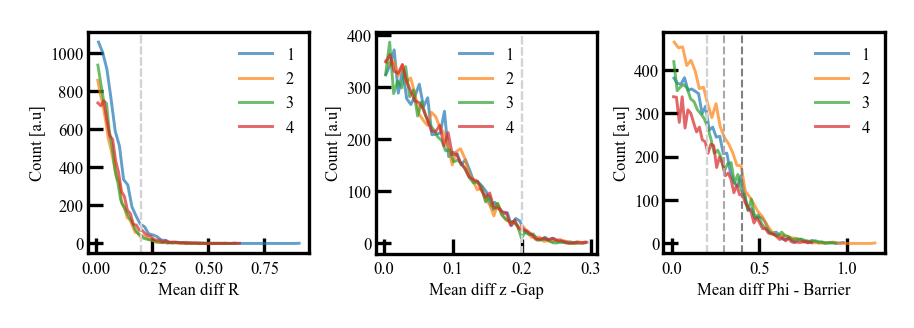

In [123]:
dpi=300
fig = plt.figure(figsize=utils.cm2inch(9, 3), dpi=dpi)  # figsize: (width, height) in inches
gs = gridspec.GridSpec(nrows=1, ncols=3,
                       figure=fig, left=0.2, right=0.95, top=0.95, bottom=0.15, wspace=0.3, hspace=0)

hue = 'IV part'
bins_dict = {}
hist_1d_dict = {}
axs=[]

data = mean_differences_df.join(tunnel_push_fits.sort_values(['Trace', 'IV part'])['IV part'], how='left')

for ind, val in enumerate(mean_differences_df.columns):
    axs.append(fig.add_subplot(gs[ind]))
    for i in range(1, 5):
        bins, hist_1d = utils.calc_hist_1d_single(data=data[data[hue] == i][val],
                                                  xrange=(min(data[data[hue] == i][val]), max(data[data[hue] == i][val])),
                                                  xbins_num = 50, log_scale = False, bin_mode='decade')
        
        bins_dict[val] = bins
        hist_1d_dict[val] = hist_1d
        
        axs[ind].set_box_aspect(1)
        axs[ind].plot(bins_dict[val], hist_1d_dict[val], label=f'{i}', alpha=0.7, lw=0.7)
        axs[ind].legend(fontsize=4, frameon=False)
        axis_label = re.search(r'([^\[^\]]*)', val).group(1).strip()
        axs[ind].set_xlabel(f'Mean diff {axis_label}')
        axs[ind].set_ylabel('Count [a.u]')
        
        axs[ind].axvline(0.2, ls='--', c='lightgrey', lw=0.5)
        
axs[-1].axvline(0.3, ls='--', c='darkgrey', lw=0.5)
axs[-1].axvline(0.4, ls='--', c='grey', lw=0.5)

In [128]:
R_sim_good = []
gap_good = []
barrier_good_1 = []
barrier_good_2 = []
barrier_good_3 = []
R_meas_good = []
for which_trace in tqdm(tunnel_push_fits['Trace'].unique()):
    # print(which_trace)
    R_mean = tunnel_push_fits[tunnel_push_fits['Trace'] == which_trace]['R [Ohm]'].mean()
    gap_mean = tunnel_push_fits[tunnel_push_fits['Trace'] == which_trace]['z -Gap [nm]'].mean()
    barrier_mean = tunnel_push_fits[tunnel_push_fits['Trace'] == which_trace]['Phi - Barrier [eV]'].mean()

#     print(abs(tunnel_push_fits[tunnel_push_fits['Trace'] == which_trace]['R [Ohm]'] - R_mean)/R_mean)
#     print(np.all(abs(tunnel_push_fits[tunnel_push_fits['Trace'] == which_trace]['R [Ohm]'] - R_mean)/R_mean < 0.2))

#     print(abs(tunnel_push_fits[tunnel_push_fits['Trace'] == which_trace]['z -Gap [nm]'] - gap_mean)/gap_mean)
#     print(np.all(abs(tunnel_push_fits[tunnel_push_fits['Trace'] == which_trace]['z -Gap [nm]'] - gap_mean)/gap_mean < 0.2))

#     print(abs(tunnel_push_fits[tunnel_push_fits['Trace'] == which_trace]['Phi - Barrier [eV]'] - barrier_mean)/barrier_mean)
#     print(np.all(abs(tunnel_push_fits[tunnel_push_fits['Trace'] == which_trace]['Phi - Barrier [eV]'] - barrier_mean)/barrier_mean < 0.2))

    # if np.all(abs(tunnel_push_fits[tunnel_push_fits['Trace'] == which_trace]['R [Ohm]'] - R_mean)/R_mean < 0.2) and \
    #    np.all(abs(tunnel_push_fits[tunnel_push_fits['Trace'] == which_trace]['z -Gap [nm]'] - gap_mean)/gap_mean < 0.2) and\
    #    np.all(abs(tunnel_push_fits[tunnel_push_fits['Trace'] == which_trace]['Phi - Barrier [eV]'] - barrier_mean)/barrier_mean < 0.3) and \
    #    np.all(abs(np.log10(tunnel_push_fits[tunnel_push_fits['Trace'] == which_trace]['R_meas_mean [Ohm]']) - 
    #               np.log10(tunnel_push_fits[tunnel_push_fits['Trace'] == which_trace]['R [Ohm]'])) < np.log10(2)):
    #     collected_traces.append(which_trace)
    
    if np.all(abs(tunnel_push_fits[tunnel_push_fits['Trace'] == which_trace]['R [Ohm]'] - R_mean)/R_mean < 0.2):
        R_sim_good.append(which_trace)
        
    if np.all(abs(tunnel_push_fits[tunnel_push_fits['Trace'] == which_trace]['z -Gap [nm]'] - gap_mean)/gap_mean < 0.2):
        gap_good.append(which_trace)
        
    if np.all(abs(tunnel_push_fits[tunnel_push_fits['Trace'] == which_trace]['Phi - Barrier [eV]'] - barrier_mean)/barrier_mean < 0.2):
        barrier_good_1.append(which_trace)
    
    if np.all(abs(tunnel_push_fits[tunnel_push_fits['Trace'] == which_trace]['Phi - Barrier [eV]'] - barrier_mean)/barrier_mean < 0.3):
        barrier_good_2.append(which_trace)
        
    if np.all(abs(tunnel_push_fits[tunnel_push_fits['Trace'] == which_trace]['Phi - Barrier [eV]'] - barrier_mean)/barrier_mean < 0.4):
        barrier_good_3.append(which_trace)
    
    if np.all(abs(np.log10(tunnel_push_fits[tunnel_push_fits['Trace'] == which_trace]['R_meas_mean [Ohm]']) - 
                  np.log10(tunnel_push_fits[tunnel_push_fits['Trace'] == which_trace]['R [Ohm]'])) < np.log10(2)):
        R_meas_good.append(which_trace)
        
R_sim_good = np.array(R_sim_good)
gap_good = np.array(gap_good)
barrier_good_1 = np.array(barrier_good_1)
barrier_good_2 = np.array(barrier_good_2)
barrier_good_3 = np.array(barrier_good_3)
R_meas_good = np.array(R_meas_good)

  0%|          | 0/6219 [00:00<?, ?it/s]

In [129]:
print(R_sim_good.shape)
print(gap_good.shape)
print(barrier_good_1.shape)
print(barrier_good_2.shape)
print(barrier_good_3.shape)
print(R_meas_good.shape)

(5606,)
(5791,)
(1509,)
(2862,)
(4151,)
(6029,)


In [144]:
print(np.intersect1d(barrier_good_1, np.intersect1d(R_meas_good, np.intersect1d(R_sim_good, gap_good, assume_unique=True), assume_unique=True), assume_unique=True).shape)
print(np.intersect1d(barrier_good_2, np.intersect1d(R_meas_good, np.intersect1d(R_sim_good, gap_good, assume_unique=True), assume_unique=True), assume_unique=True).shape)
print(np.intersect1d(barrier_good_3, np.intersect1d(R_meas_good, np.intersect1d(R_sim_good, gap_good, assume_unique=True), assume_unique=True), assume_unique=True).shape)

(1440,)
(2646,)
(3781,)


In [145]:
good_traces = np.intersect1d(barrier_good_2, np.intersect1d(R_meas_good, np.intersect1d(R_sim_good, gap_good, assume_unique=True), assume_unique=True), assume_unique=True)

In [146]:
tunnel_push_fits_filt = tunnel_push_fits[np.array(list(map(lambda x: x in good_traces, tunnel_push_fits['Trace'])))].sort_values(by=['Trace', 'IV part'])

In [147]:
tunnel_push_fits_filt

,Trace,Fit Trace,R [Ohm],z -Gap [nm],Phi - Barrier [eV],dR/dz,dR/dPhi,G_meas1 [G0],dG/G_meas1,G_meas2 [G0],dG/G_meas2,IV part,R_meas1 [Ohm],R_meas2 [Ohm],R_meas_mean [Ohm]
0,19515,'1_IV_trace_19515_push_pl',123337740.0,0.43,1.38,1.690506e+18,1.103075e+27,0.000104,0.098067,0.000115,0.046079,1,1.243849e+08,1.117619e+08,1.180734e+08
4413,19515,'2_IV_trace_19515_push_pl',115852820.0,0.41,1.54,1.670889e+18,9.379184e+26,0.000104,0.098067,0.000115,0.046079,2,1.243849e+08,1.117619e+08,1.180734e+08
8826,19515,'3_IV_trace_19515_push_pl',118121180.0,0.43,1.35,1.605310e+18,1.066052e+27,0.000104,0.098067,0.000115,0.046079,3,1.243849e+08,1.117619e+08,1.180734e+08
13239,19515,'4_IV_trace_19515_push_pl',115108080.0,0.48,0.96,1.354317e+18,1.531600e+27,0.000104,0.098067,0.000115,0.046079,4,1.243849e+08,1.117619e+08,1.180734e+08
1,19529,'1_IV_trace_19529_push_pl',172076560.0,0.53,0.88,1.912228e+18,2.374670e+27,0.000081,0.070921,0.000086,0.089175,1,1.601890e+08,1.497290e+08,1.549590e+08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24874,49083,'4_IV_trace_49083_push_pl',93806128.0,0.35,2.20,1.595239e+18,5.499750e+26,0.000113,0.088571,0.000294,0.168821,4,1.142715e+08,4.391052e+07,7.909103e+07
19457,49088,'1_IV_trace_49088_push_pl',195853160.0,0.47,1.33,2.604451e+18,1.969822e+27,0.000067,0.066466,0.000087,0.032976,1,1.939109e+08,1.475520e+08,1.707315e+08
21263,49088,'2_IV_trace_49088_push_pl',201705620.0,0.50,1.13,2.508884e+18,2.352905e+27,0.000067,0.066466,0.000087,0.032976,2,1.939109e+08,1.475520e+08,1.707315e+08
23069,49088,'3_IV_trace_49088_push_pl',224151430.0,0.52,1.06,2.703747e+18,2.815920e+27,0.000067,0.066466,0.000087,0.032976,3,1.939109e+08,1.475520e+08,1.707315e+08


In [149]:
tunnel_push_fits_filt.to_excel(excel_writer=home_folder.joinpath('results/IVs/selected/Tunnel_22_02_03_push_fits_filtered.xlsx'),
                               columns=['Trace', 'Fit Trace', 'R [Ohm]', 'z -Gap [nm]', 'Phi - Barrier [eV]', 'dR/dz', 'dR/dPhi', 'G_meas1 [G0]',
                                        'dG/G_meas1', 'G_meas2 [G0]', 'dG/G_meas2', 'R_meas1 [Ohm]', 'R_meas2 [Ohm]', 'R_meas_mean [Ohm]'])

[<AxesSubplot:xlabel='R [Ohm]', ylabel='Counts [a.u.]'>,
 <AxesSubplot:xlabel='z -Gap [nm]', ylabel='R [Ohm]'>,
 <AxesSubplot:xlabel='Phi - Barrier [eV]', ylabel='R [Ohm]'>,
 <AxesSubplot:xlabel='R [Ohm]', ylabel='z -Gap [nm]'>,
 <AxesSubplot:xlabel='z -Gap [nm]', ylabel='Counts [a.u.]'>,
 <AxesSubplot:xlabel='Phi - Barrier [eV]', ylabel='z -Gap [nm]'>,
 <AxesSubplot:xlabel='R [Ohm]', ylabel='Phi - Barrier [eV]'>,
 <AxesSubplot:xlabel='z -Gap [nm]', ylabel='Phi - Barrier [eV]'>,
 <AxesSubplot:xlabel='Phi - Barrier [eV]', ylabel='Counts [a.u.]'>]

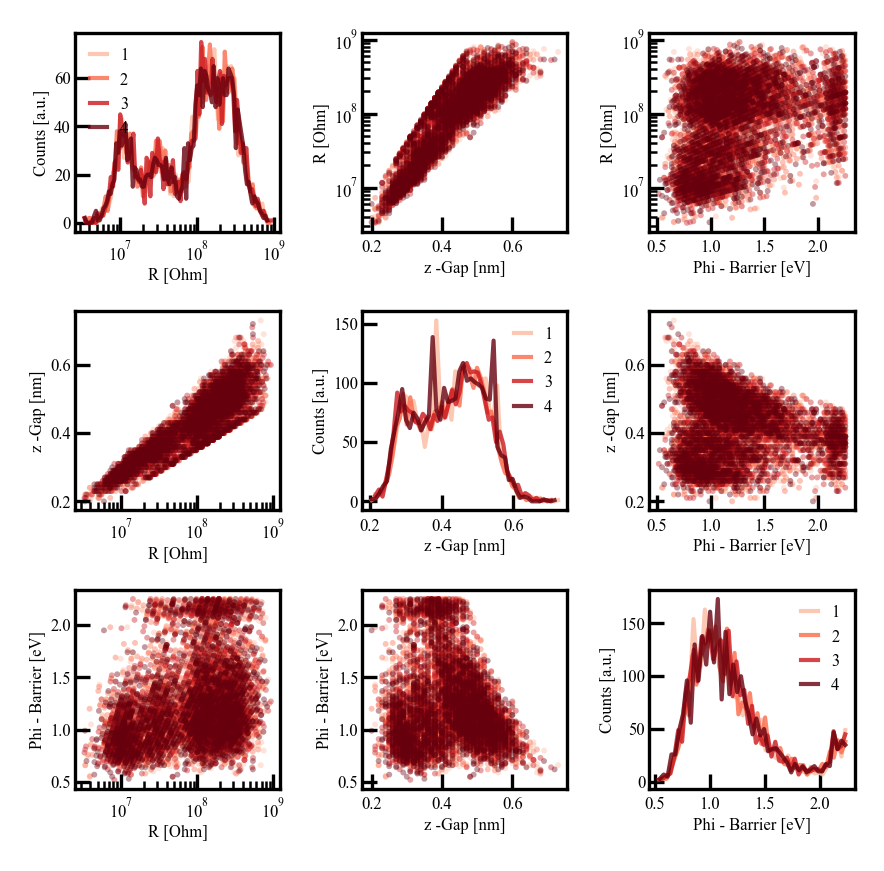

In [154]:
scatter_plot_matrix(data=tunnel_push_fits_filt, col_names=('R [Ohm]', 'z -Gap [nm]', 'Phi - Barrier [eV]'), set_log=(True, False, False), set_limits=None,
                    hue='IV part', cmap = colormaps['Reds'], cmap_reversed=False, bins_num=(100, 50, 50),
                    figsize=None, dpi=300, min_plot_size=utils.cm2inch(8, 8), s=2, edgecolor='None', alpha=0.4)

[<AxesSubplot:xlabel='R [Ohm]', ylabel='Counts [a.u.]'>,
 <AxesSubplot:xlabel='z -Gap [nm]', ylabel='R [Ohm]'>,
 <AxesSubplot:xlabel='Phi - Barrier [eV]', ylabel='R [Ohm]'>,
 <AxesSubplot:xlabel='R [Ohm]', ylabel='z -Gap [nm]'>,
 <AxesSubplot:xlabel='z -Gap [nm]', ylabel='Counts [a.u.]'>,
 <AxesSubplot:xlabel='Phi - Barrier [eV]', ylabel='z -Gap [nm]'>,
 <AxesSubplot:xlabel='R [Ohm]', ylabel='Phi - Barrier [eV]'>,
 <AxesSubplot:xlabel='z -Gap [nm]', ylabel='Phi - Barrier [eV]'>,
 <AxesSubplot:xlabel='Phi - Barrier [eV]', ylabel='Counts [a.u.]'>]

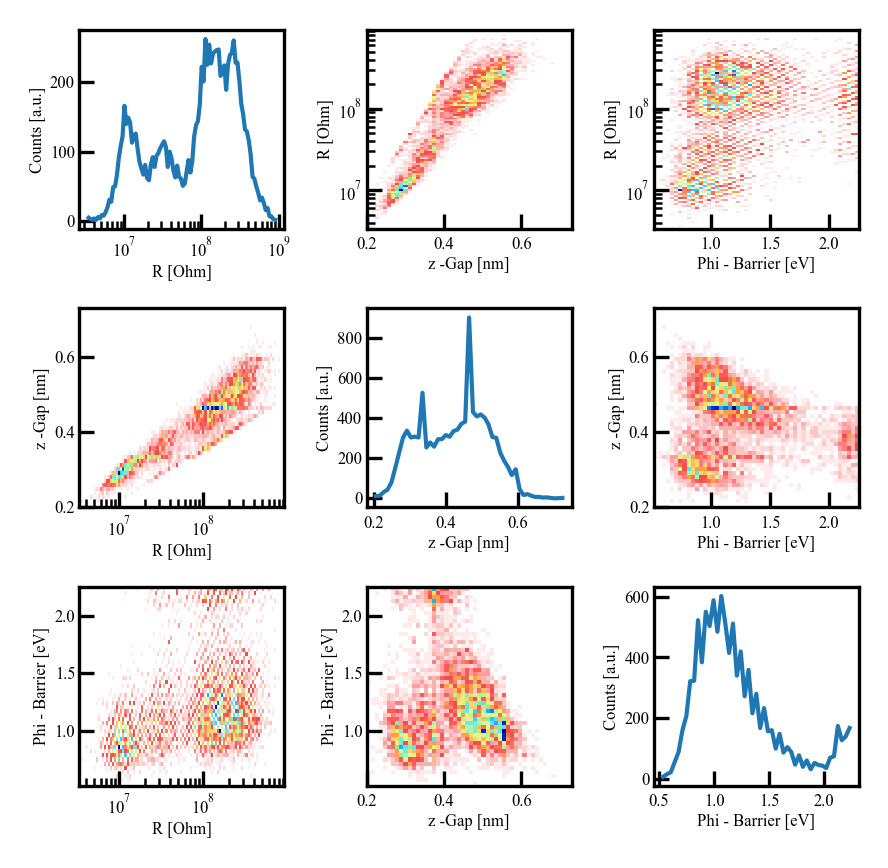

In [156]:
hist_2d_plot_matrix(data=tunnel_push_fits_filt, col_names=('R [Ohm]', 'z -Gap [nm]', 'Phi - Barrier [eV]'), set_log=(True, False, False), set_limits=None,
                    hue='IV part', cmap =utils.cmap_geo32, cmap_reversed=False, bins_num=(100, 50, 50),
                    figsize=None, dpi=300, min_plot_size=utils.cm2inch(8, 8), s=2, edgecolor='None', alpha=0.4)